In [47]:
# Libraries for working with multidimensional arrays
import numpy as np
import xarray as xr
import pandas as pd

# Libraries for plotting and visualising data
import matplotlib.path as mpath
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature


import os
import sys
import json
from zipfile import ZipFile
import time
import base64
from IPython.core.display import HTML

import requests
import warnings
warnings.filterwarnings('ignore')

In [2]:
pip install -U hda

Note: you may need to restart the kernel to use updated packages.


In [3]:
import requests
import tqdm
from hda import Client, Configuration

In [4]:
dataset_id = "EO:ECMWF:DAT:REANALYSIS_ERA5_SINGLE_LEVELS_MONTHLY_MEANS"

In [5]:
{
  "dataset_id": "EO:ECMWF:DAT:REANALYSIS_ERA5_SINGLE_LEVELS_MONTHLY_MEANS",
  "itemsPerPage": 200,
  "startIndex": 0
}

{'dataset_id': 'EO:ECMWF:DAT:REANALYSIS_ERA5_SINGLE_LEVELS_MONTHLY_MEANS',
 'itemsPerPage': 200,
 'startIndex': 0}

In [6]:
data = {
  "dataset_id": "EO:ECMWF:DAT:REANALYSIS_ERA5_SINGLE_LEVELS_MONTHLY_MEANS",
  "product_type": [
    "monthly_averaged_reanalysis"
  ],
  "variable": [
    "Total precipitation, Snowfall"
  ],
  "year": [
    "1979",
    "1980",
    "1981",
    "1982",
    "1983",
    "1984",
    "1985",
    "1986",
    "1987",
    "1988",
    "1989",
    "1990",
    "1991",
    "1992",
    "1993",
    "1994",
    "1995",
    "1996",
    "1997",
    "1998",
    "1999",
    "2000",
    "2001",
    "2002",
    "2003",
    "2004",
    "2005",
    "2006",
    "2007",
    "2008",
    "2009",
    "2010",
    "2011",
    "2012",
    "2013",
    "2014",
    "2015",
    "2016",
    "2017",
    "2018",
    "2019",
    "2020",
    "2021",
    "2022",
    "2023"
      ],
  
  "month": [
    "01",
    "02",
    "03",
    "04",
    "05",
    "06",
    "07",
    "08",
    "09",
    "10", 
    "11",
    "12"],
  "time": [
    "00:00",
    "06:00",
    "12:00",
    "18:00"
  ],
  "bbox": [
    -180,
    90,
    180,
    60
  ],
  "format": "netcdf",
  "itemsPerPage": 200,
  "startIndex": 0
}

In [7]:
#def load_data():
conf = Configuration(user = "zcasty", password = "green1234Zaria")
    #hda_client = Client(config = conf)
    #c = Client(debug=True)
c = Client(config=conf, max_workers=12)
matches = c.search(data)
print(matches)
matches.download()

SearchResults[items=1,volume=ND]


## List Files

In [7]:
ls

 Volume in drive C is OS
 Volume Serial Number is 6886-C763

 Directory of C:\Users\zaca1262\Precip. Partitioning

06/16/2025  11:49 AM    <DIR>          .
05/20/2025  02:06 PM    <DIR>          ..
05/27/2025  03:17 PM                11 .gitignore
06/09/2025  01:03 PM    <DIR>          .ipynb_checkpoints
05/27/2025  03:14 PM    <DIR>          Arctic_Liquid_Precip
12/02/2024  12:57 PM         3,039,542 DecadalTrends_Enhanced.png
12/02/2024  09:44 AM         2,348,645 DecadalTrends_NoColorBar.png
12/02/2024  02:06 PM         2,321,962 DecadalTrends_TP_SF.png
06/13/2025  01:36 PM         8,107,957 evaporation.ipynb
10/14/2024  10:28 AM            15,127 JanuaryArcticTotals.png
06/03/2025  11:05 AM            15,127 JanuaryArcticTotals_Liquid_Precip_LowerArea.png
05/28/2025  01:17 PM         5,190,877 JanuaryJulyArcticTotals.png
06/03/2025  11:05 AM            15,127 JanuaryJulyArcticTotals_AdjustedSize.png
11/01/2024  08:58 AM            15,127 JanuaryJulyArcticTotals_SeparateColorbars.pn

# Original Data for TP

In [8]:
xr.open_dataset("reanalysis-era5-single-levels-monthly-means-d891cf072f02d7845c0ec8350ca6478a.nc")

<xarray.Dataset>
Dimensions:    (date: 540, latitude: 121, longitude: 1440)
Coordinates:
    number     int64 ...
  * date       (date) int64 19790101 19790201 19790301 ... 20231101 20231201
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... 60.5 60.25 60.0
  * longitude  (longitude) float64 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
    expver     (date) object ...
Data variables:
    tp         (date, latitude, longitude) float32 ...
    sf         (date, latitude, longitude) float32 ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2024-10-08T17:54 GRIB to CDM+CF via cfgrib-0.9.1...

In [9]:
file_path = "reanalysis-era5-single-levels-monthly-means-d891cf072f02d7845c0ec8350ca6478a.nc"

ds = xr.open_dataset(file_path)
print(ds)

tp = ds['tp']
sf = ds['sf']

<xarray.Dataset>
Dimensions:    (date: 540, latitude: 121, longitude: 1440)
Coordinates:
    number     int64 ...
  * date       (date) int64 19790101 19790201 19790301 ... 20231101 20231201
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... 60.5 60.25 60.0
  * longitude  (longitude) float64 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
    expver     (date) object ...
Data variables:
    tp         (date, latitude, longitude) float32 ...
    sf         (date, latitude, longitude) float32 ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2024-10-08T17:54 GRIB to CDM+CF via cfgrib-0.9.1...


In [10]:
# Convert from integers to datetime (if needed)
tp['date'] = pd.to_datetime(tp['date'].values, format='%Y%m%d', errors='coerce')
sf['date'] = pd.to_datetime(sf['date'].values, format='%Y%m%d', errors='coerce') 

In [11]:
tp

<xarray.DataArray 'tp' (date: 540, latitude: 121, longitude: 1440)>
[94089600 values with dtype=float32]
Coordinates:
    number     int64 ...
  * date       (date) datetime64[ns] 1979-01-01 1979-02-01 ... 2023-12-01
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... 60.5 60.25 60.0
  * longitude  (longitude) float64 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
    expver     (date) object ...
Attributes: (12/32)
    GRIB_paramId:                             228
    GRIB_dataType:                            fc
    GRIB_numberOfPoints:                      174240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            avgad
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_units:                               m
    long_name:                                Total precipitation
    units:                                    m
    standard_name:                            unknown
    GRIB_surface:                             0.0

In [12]:
sf

<xarray.DataArray 'sf' (date: 540, latitude: 121, longitude: 1440)>
[94089600 values with dtype=float32]
Coordinates:
    number     int64 ...
  * date       (date) datetime64[ns] 1979-01-01 1979-02-01 ... 2023-12-01
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... 60.5 60.25 60.0
  * longitude  (longitude) float64 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
    expver     (date) object ...
Attributes: (12/32)
    GRIB_paramId:                             144
    GRIB_dataType:                            fc
    GRIB_numberOfPoints:                      174240
    GRIB_typeOfLevel:                         surface
    GRIB_stepUnits:                           1
    GRIB_stepType:                            avgad
    ...                                       ...
    GRIB_totalNumber:                         0
    GRIB_units:                               m of water equivalent
    long_name:                                Snowfall
    units:                                    m of water equivalent
    standard_name:                            lwe_thickness_of_snowfall_amount
    GRIB_surface:                             0.0

## Start of code

In [13]:
import numpy as np
import pandas as pd
import xarray as xr

# Convert ERA5 dates (e.g., 19790101) to datetime64
ds = ds.assign_coords(date=("date", pd.to_datetime(ds.date.values.astype(str), format='%Y%m%d')))
tp = ds['tp']
sf = ds['sf']

tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']
rain = (tp - sf).clip(min=0)

def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    if month in [3, 4, 5]: return 'Spring'
    if month in [6, 7, 8]: return 'Summer'
    return 'Fall'

season = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), tp['date'].dt.month)
tp.coords['season'] = season
sf.coords['season'] = season
rain.coords['season'] = season

tp_seasonal = tp.groupby('season').mean('date')
sf_seasonal = sf.groupby('season').mean('date')
rain_seasonal = rain.groupby('season').mean('date')

rain_to_total = (rain_seasonal / tp_seasonal.where(tp_seasonal > 0)).clip(0, 1)
rain_to_snow = (rain_seasonal / sf_seasonal.where(sf_seasonal > 0)).clip(0, 1)

# Reindex to standard season order
season_order = ['Winter', 'Spring', 'Summer', 'Fall']
rain_to_total = rain_to_total.reindex(season=season_order)
rain_to_snow = rain_to_snow.reindex(season=season_order)


In [14]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath

def plot_4panel_ratio(data, title, cmap='Greens'):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12), subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    vmin, vmax = 0, 1
    levels = np.linspace(0, 1, 11)
    seasons = ['Winter (Dec–Jan–Feb)', 'Spring (Mar–Apr–May)', 'Summer (Jun–Jul–Aug)', 'Fall (Sep–Oct–Nov)']

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle boundary
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        dat = data.isel(season=i)
        pcm = ax.pcolormesh(data.longitude, data.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        ax.contour(data.longitude, data.latitude, dat,
                   levels=levels, linewidths=0.6, colors='black', transform=ccrs.PlateCarree())
        ax.set_title(seasons[i], fontsize=12)

    # Shared colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label(data.name + ' Ratio (0–1)')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()


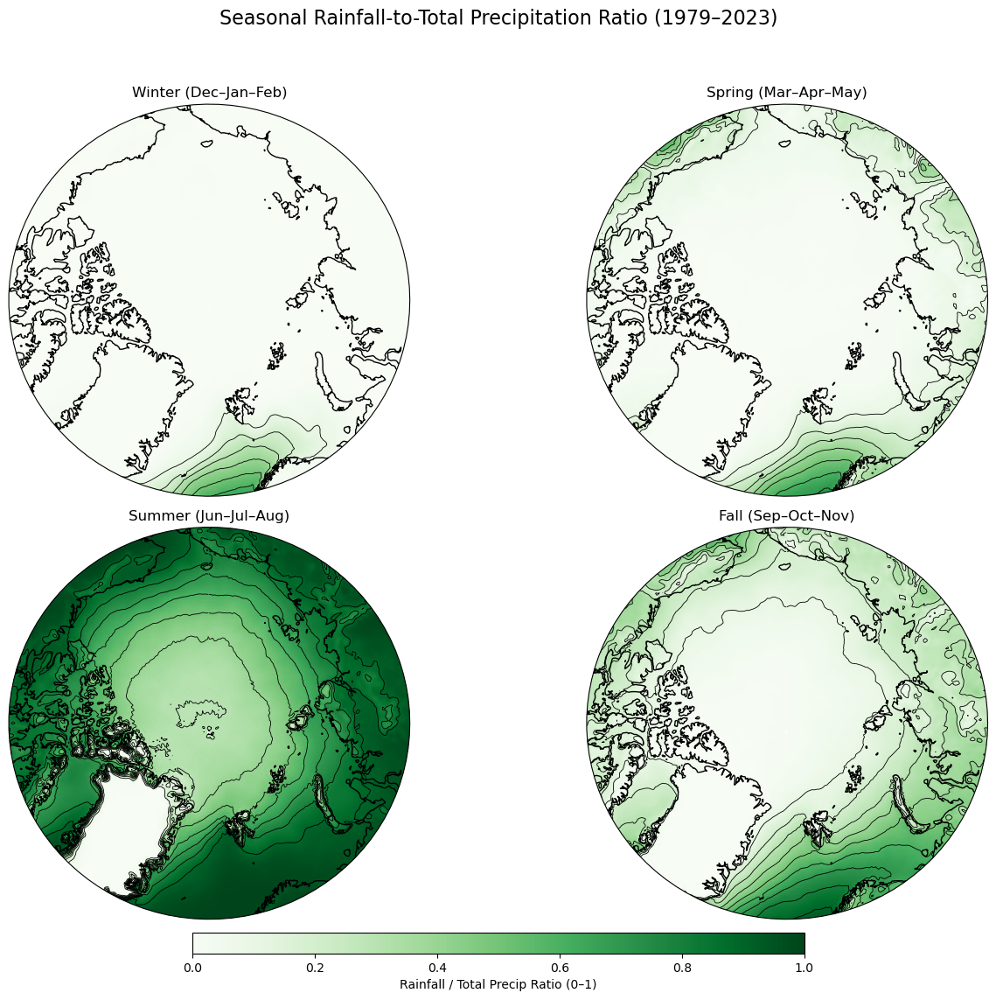

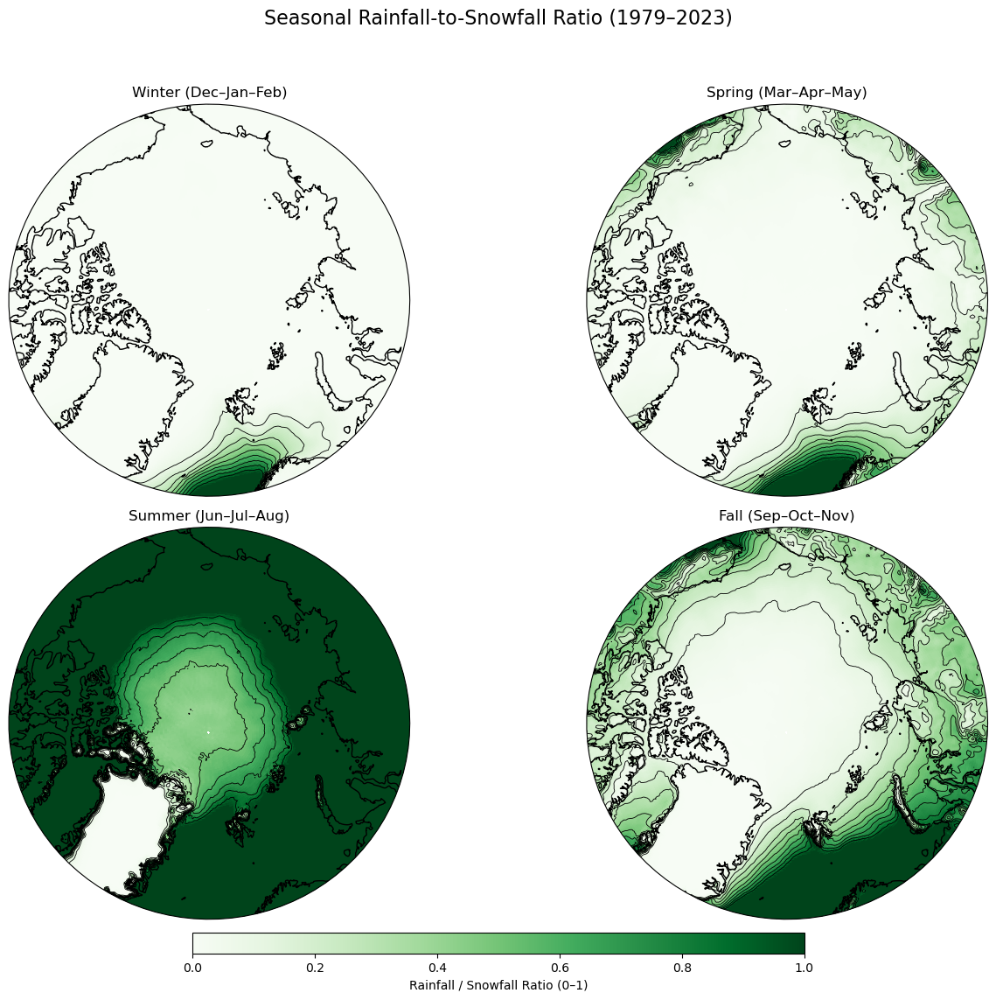

In [15]:
rain_to_total.name = "Rainfall / Total Precip"
rain_to_snow.name = "Rainfall / Snowfall"

plot_4panel_ratio(rain_to_total, "Seasonal Rainfall-to-Total Precipitation Ratio (1979–2023)")
plot_4panel_ratio(rain_to_snow, "Seasonal Rainfall-to-Snowfall Ratio (1979–2023)")


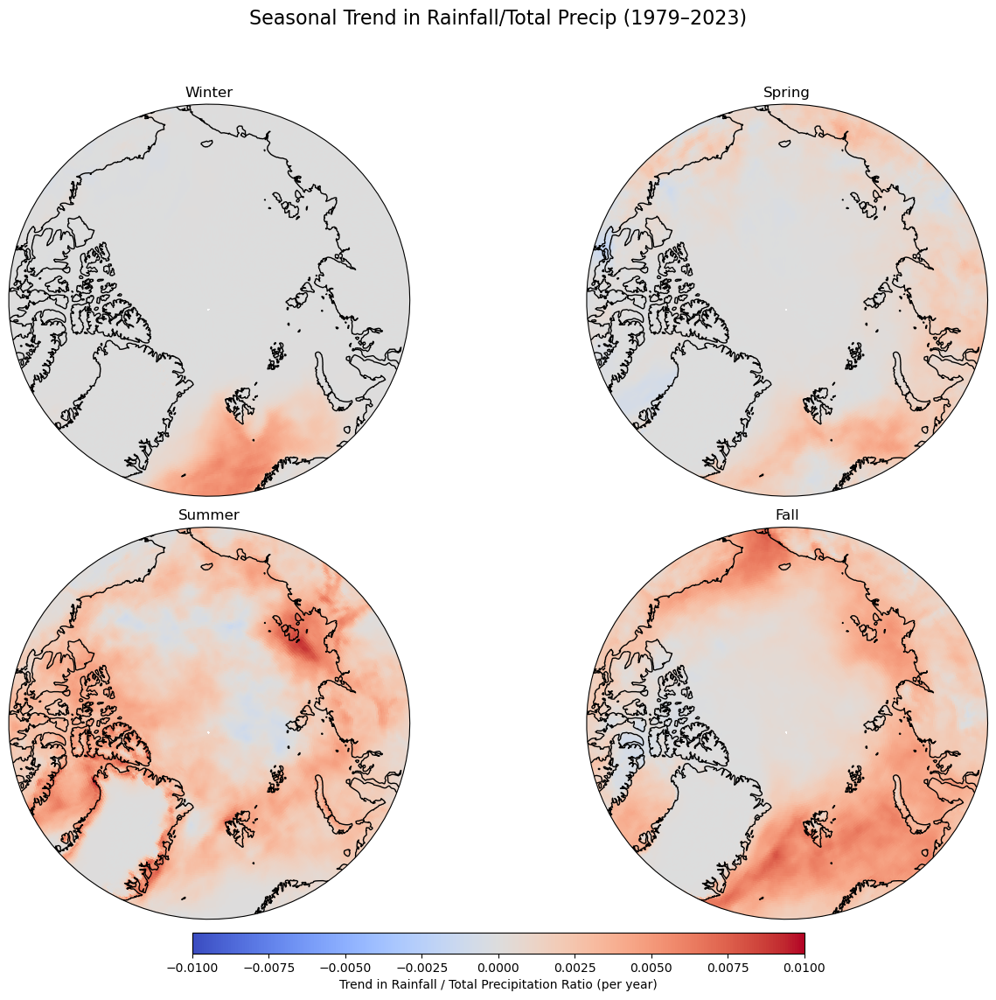

In [156]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath

# Extract total precipitation and snowfall
tp = ds['tp']
sf = ds['sf']
tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']

# Compute rainfall (liquid = TP - SF)
rain = (tp - sf).clip(min=0)

# -----------------------------
# 2. ASSIGN SEASON COORDINATE
# -----------------------------
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), tp['date'].dt.month)
tp.coords['season'] = season_labels
sf.coords['season'] = season_labels
rain.coords['season'] = season_labels

# -----------------------------
# 3. TREND FUNCTION
# -----------------------------
def compute_trend_over_time(da):
    """Compute linear trend over 'date' for each grid cell."""
    years = da['date'].dt.year
    x = years - years.mean()
    slope = ((x * da).mean('date')) / ((x**2).mean())
    return slope

# -----------------------------
# 4. COMPUTE TREND FOR EACH SEASON
# -----------------------------
trend_maps = []

for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    rain_season = rain.where(rain['season'] == season)
    tp_season = tp.where(tp['season'] == season)

    ratio = (rain_season / tp_season.where(tp_season > 0)).clip(0, 1)
    trend = compute_trend_over_time(ratio)
    trend_maps.append(trend)

# Stack into single DataArray
trend_da = xr.concat(trend_maps, dim='season')
trend_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
trend_da.name = 'Rainfall/Total Precip Trend'
trend_da.attrs['units'] = 'change per year'

# -----------------------------
# 5. PLOT 4-PANEL TREND MAPS
# -----------------------------
def plot_seasonal_trends(trend_data, title="Seasonal Trend in Rainfall/Total Precip (1979–2023)", cmap='coolwarm', vmin=-0.01, vmax=0.01):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic boundary circle
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = trend_data['season'].values[i]
        dat = trend_data.sel(season=season)

        pcm = ax.pcolormesh(trend_data.longitude, trend_data.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        ax.set_title(season, fontsize=12)

    # Colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Trend in Rainfall / Total Precipitation Ratio (per year)")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# Plot
plot_seasonal_trends(trend_da)


In [165]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
from scipy.stats import linregress

# --- Extract total precipitation and snowfall ---
tp = ds['tp']
sf = ds['sf']
tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']

# --- Compute rainfall (liquid = TP - SF) ---
rain = (tp - sf).clip(min=0)

# --- Assign seasonal labels ---
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), tp['date'].dt.month)
tp.coords['season'] = season_labels
sf.coords['season'] = season_labels
rain.coords['season'] = season_labels

# --- Compute trend + p-values over time ---
def compute_trend_and_pval(da):
    time = da['date'].dt.year.values
    x = time - time.mean()
    y = da.transpose('date', 'latitude', 'longitude').values

    trend = np.full(y.shape[1:], np.nan)
    pval = np.full(y.shape[1:], np.nan)

    for i in range(y.shape[1]):
        for j in range(y.shape[2]):
            y_ij = y[:, i, j]
            if np.all(np.isnan(y_ij)):
                continue
            slope, _, _, p, _ = linregress(x, y_ij)
            trend[i, j] = slope * 100  # % per year
            pval[i, j] = p

    trend_xr = xr.DataArray(trend, coords=[da.latitude, da.longitude], dims=['latitude', 'longitude'])
    pval_xr = xr.DataArray(pval, coords=[da.latitude, da.longitude], dims=['latitude', 'longitude'])
    return trend_xr, pval_xr

# --- Compute trend and pval for each season ---
trend_maps = []
pval_maps = []

for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    rain_season = rain.where(rain['season'] == season)
    tp_season = tp.where(tp['season'] == season)
    ratio = (rain_season / tp_season.where(tp_season > 0)).clip(0, 1)

    trend, pval = compute_trend_and_pval(ratio)
    trend_maps.append(trend)
    pval_maps.append(pval)

# --- Combine into DataArrays ---
trend_da = xr.concat(trend_maps, dim='season')
pval_da = xr.concat(pval_maps, dim='season')
trend_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
pval_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
trend_da.name = 'Rainfall/Total Precip Trend'
trend_da.attrs['units'] = '% per year'

# --- Updated Plotting Function with Hatching ---
def plot_seasonal_trends_with_hatching(trend_data, pval_data,
                                       title="Seasonal Trend in Rainfall/Total Precip (%) (1979–2023)",
                                       cmap='coolwarm', vmin=-1, vmax=1):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic Circle
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = trend_data['season'].values[i]
        dat = trend_data.sel(season=season)
        pval = pval_data.sel(season=season)
        sig = (pval < 0.1).astype(int)  # <-- Changed from 0.05 to 0.1

        # Plot trend
        pcm = ax.pcolormesh(trend_data.longitude, trend_data.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        # Contour lines
        ax.contour(trend_data.longitude, trend_data.latitude, dat,
                   levels=np.arange(-1.0, 1.1, 0.5),
                   colors='black', linewidths=0.4,
                   transform=ccrs.PlateCarree())

        # Hatching where significant
        ax.contourf(trend_data.longitude, trend_data.latitude, sig,
                    levels=[0.5, 1.5], colors='none', hatches=['////'],
                    transform=ccrs.PlateCarree())

        ax.set_title(season, fontsize=12)

    # Colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Trend in Rainfall / Total Precipitation Ratio (% per year)")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()


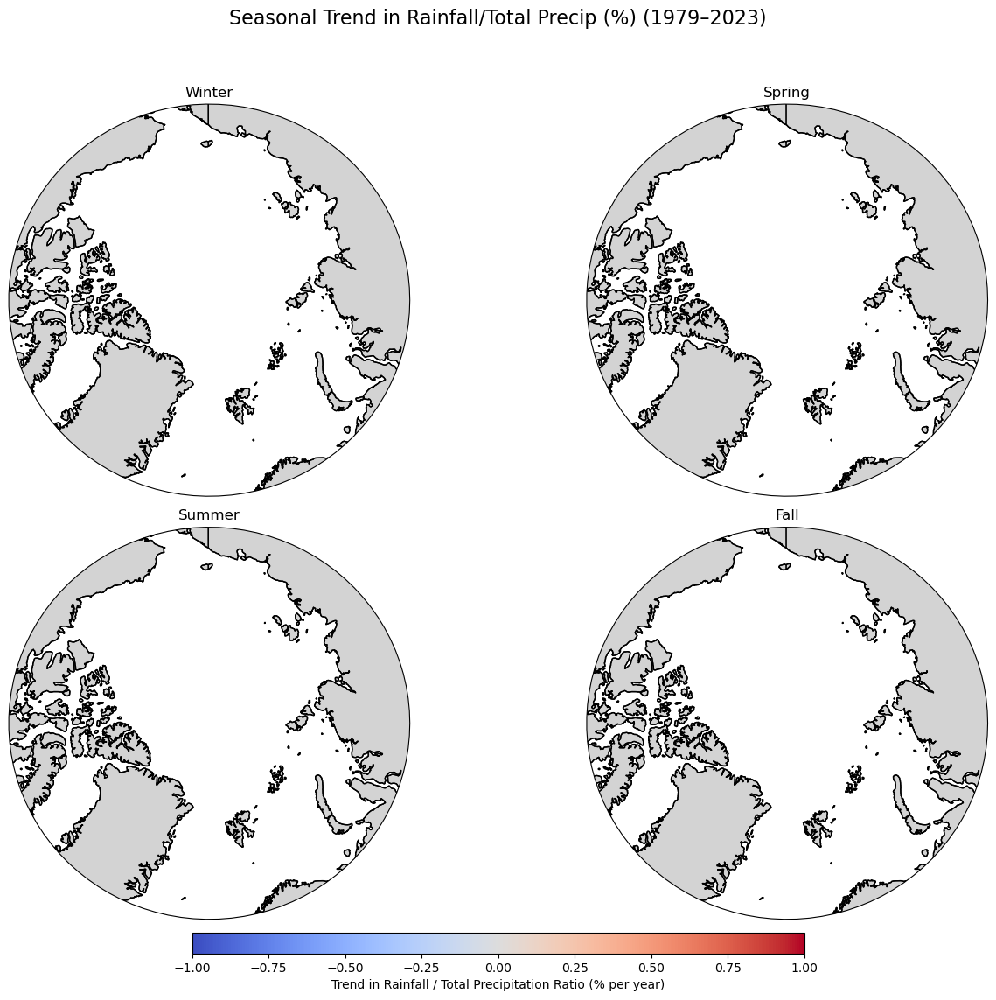

In [166]:
# Plot
plot_seasonal_trends(trend_da)

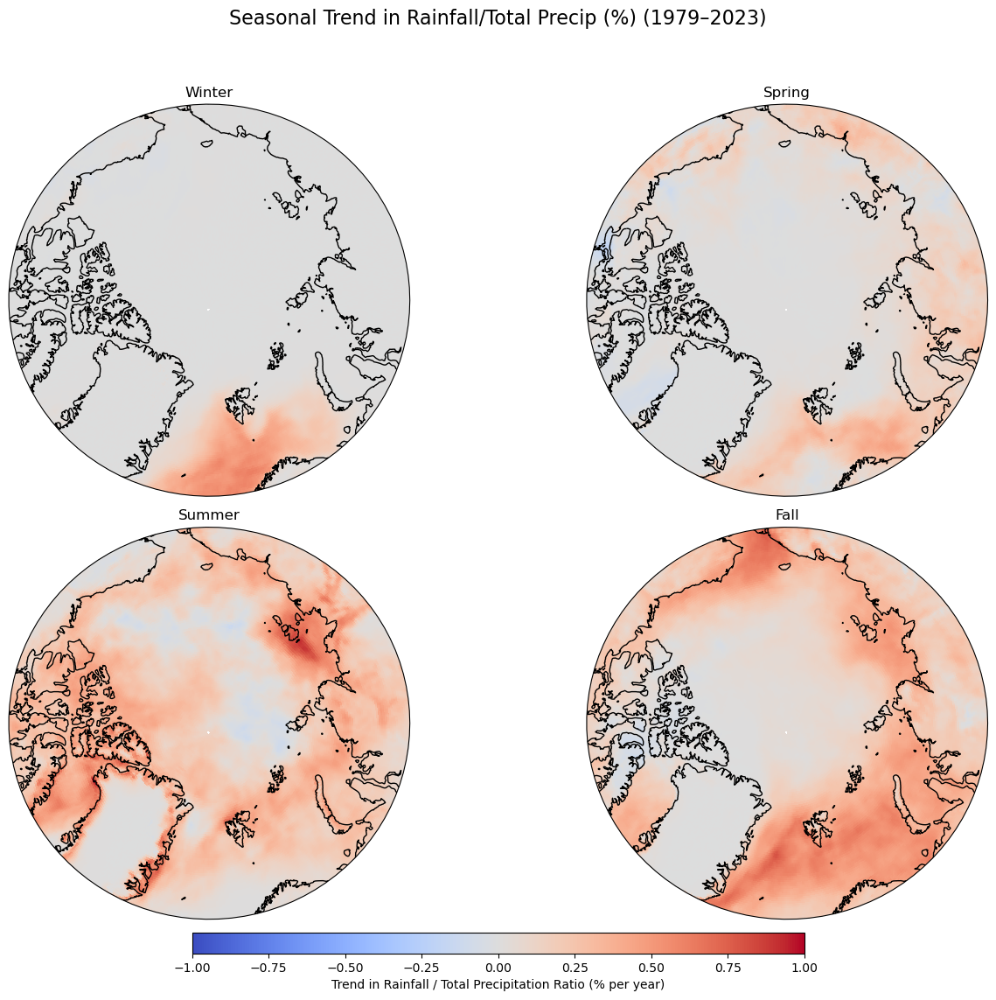

In [124]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath

# Extract total precipitation and snowfall
tp = ds['tp']
sf = ds['sf']
tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']

# Compute rainfall (liquid = TP - SF)
rain = (tp - sf).clip(min=0)

# Assign seasonal labels
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), tp['date'].dt.month)
tp.coords['season'] = season_labels
sf.coords['season'] = season_labels
rain.coords['season'] = season_labels

# Trend calculation
def compute_trend_over_time(da):
    years = da['date'].dt.year
    x = years - years.mean()
    slope = ((x * da).mean('date')) / ((x**2).mean())
    return slope

# Compute trend for each season
trend_maps = []
for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    rain_season = rain.where(rain['season'] == season)
    tp_season = tp.where(tp['season'] == season)
    ratio = (rain_season / tp_season.where(tp_season > 0)).clip(0, 1)
    trend = compute_trend_over_time(ratio) * 100  # Convert to % per year
    trend_maps.append(trend)

# Combine into DataArray
trend_da = xr.concat(trend_maps, dim='season')
trend_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
trend_da.name = 'Rainfall/Total Precip Trend'
trend_da.attrs['units'] = '% per year'

# Plotting function
def plot_seasonal_trends(trend_data, title="Seasonal Trend in Rainfall/Total Precip (%) (1979–2023)",
                         cmap='coolwarm', vmin=-1, vmax=1):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = trend_data['season'].values[i]
        dat = trend_data.sel(season=season)

        pcm = ax.pcolormesh(trend_data.longitude, trend_data.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        ax.set_title(season, fontsize=12)

        trend_masked = trend.where(pval < 0.05)
        
    # Colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Trend in Rainfall / Total Precipitation Ratio (% per year)")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# Plot
plot_seasonal_trends(trend_da)


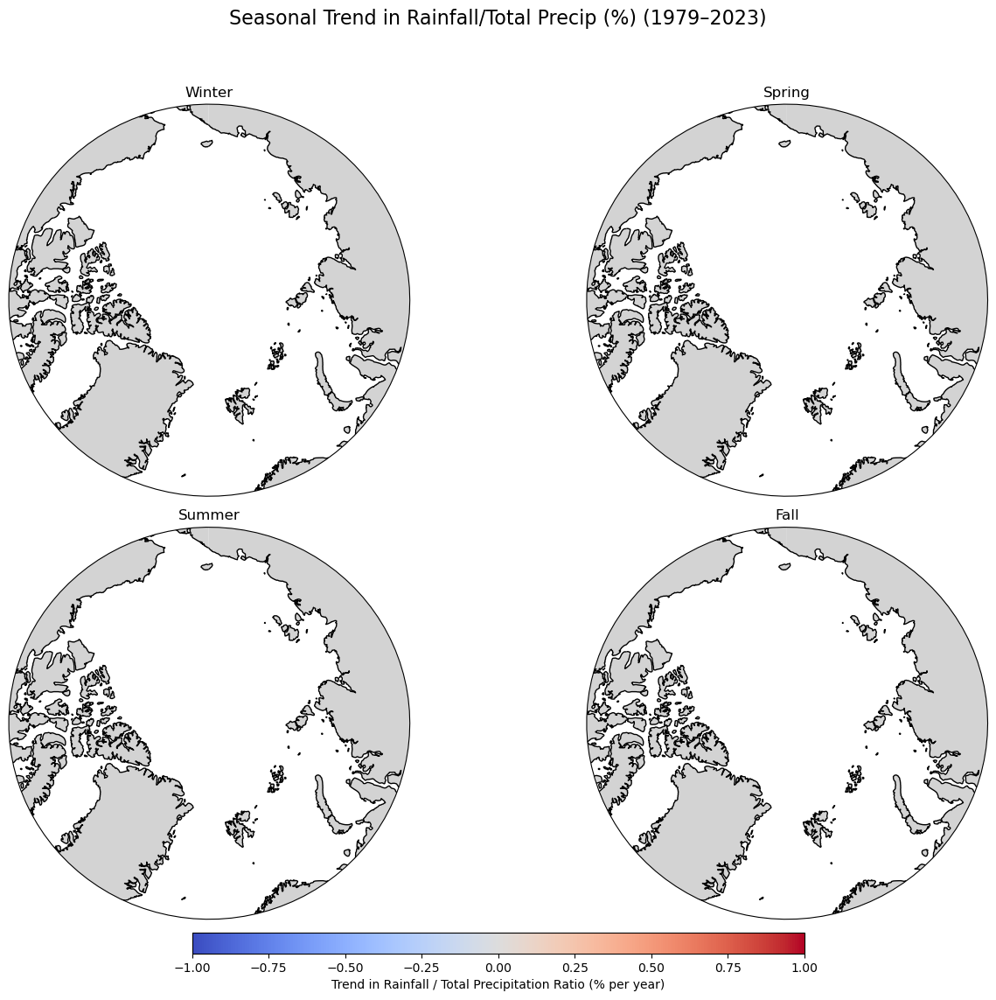

In [157]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
from scipy.stats import linregress

# Extract variables
tp = ds['tp']
sf = ds['sf']
tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']
rain = (tp - sf).clip(min=0)

# Assign seasons
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), tp['date'].dt.month)
tp.coords['season'] = season_labels
sf.coords['season'] = season_labels
rain.coords['season'] = season_labels

# Prepare time for regression
years = tp['date'].dt.year
t = (years - years[0]).values

# Trend & p-value function
def compute_trend_and_pval(da):
    y = da.transpose('date', 'latitude', 'longitude').values
    slope = np.full(y.shape[1:], np.nan)
    pval = np.full(y.shape[1:], np.nan)

    for i in range(y.shape[1]):
        for j in range(y.shape[2]):
            y_ij = y[:, i, j]
            if np.isfinite(y_ij).all() and not np.all(y_ij == 0):
                res = linregress(t, y_ij)
                slope[i, j] = res.slope * 100  # percent per year
                pval[i, j] = res.pvalue

    return xr.DataArray(slope, coords=[da.latitude, da.longitude], dims=['latitude', 'longitude']), \
           xr.DataArray(pval, coords=[da.latitude, da.longitude], dims=['latitude', 'longitude'])

# Compute trends and p-values for each season
trend_maps = []
pval_maps = []
for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    rain_season = rain.where(rain['season'] == season)
    tp_season = tp.where(tp['season'] == season)
    ratio = (rain_season / tp_season.where(tp_season > 0)).clip(0, 1)
    slope, pval = compute_trend_and_pval(ratio)
    trend_maps.append(slope)
    pval_maps.append(pval)

# Combine
trend_da = xr.concat(trend_maps, dim='season')
pval_da = xr.concat(pval_maps, dim='season')
trend_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
pval_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
trend_da.name = 'Rainfall/Total Precip Trend'
trend_da.attrs['units'] = '% per year'

# Plotting function (only significant trends shown)
def plot_significant_seasonal_trends(trend_data, pval_data, title="Seasonal Trend in Rainfall/Total Precip (%) (1979–2023)",
                         cmap='coolwarm', vmin=-1, vmax=1):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = trend_data['season'].values[i]
        dat = trend_data.sel(season=season)
        pval = pval_data.sel(season=season)

        # Mask non-significant
        dat_masked = dat.where(pval < 0.05)

        pcm = ax.pcolormesh(dat.longitude, dat.latitude, dat_masked,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        ax.set_title(season, fontsize=12)

    # Colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Trend in Rainfall / Total Precipitation Ratio (% per year)")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# Plot
plot_significant_seasonal_trends(trend_da, pval_da)


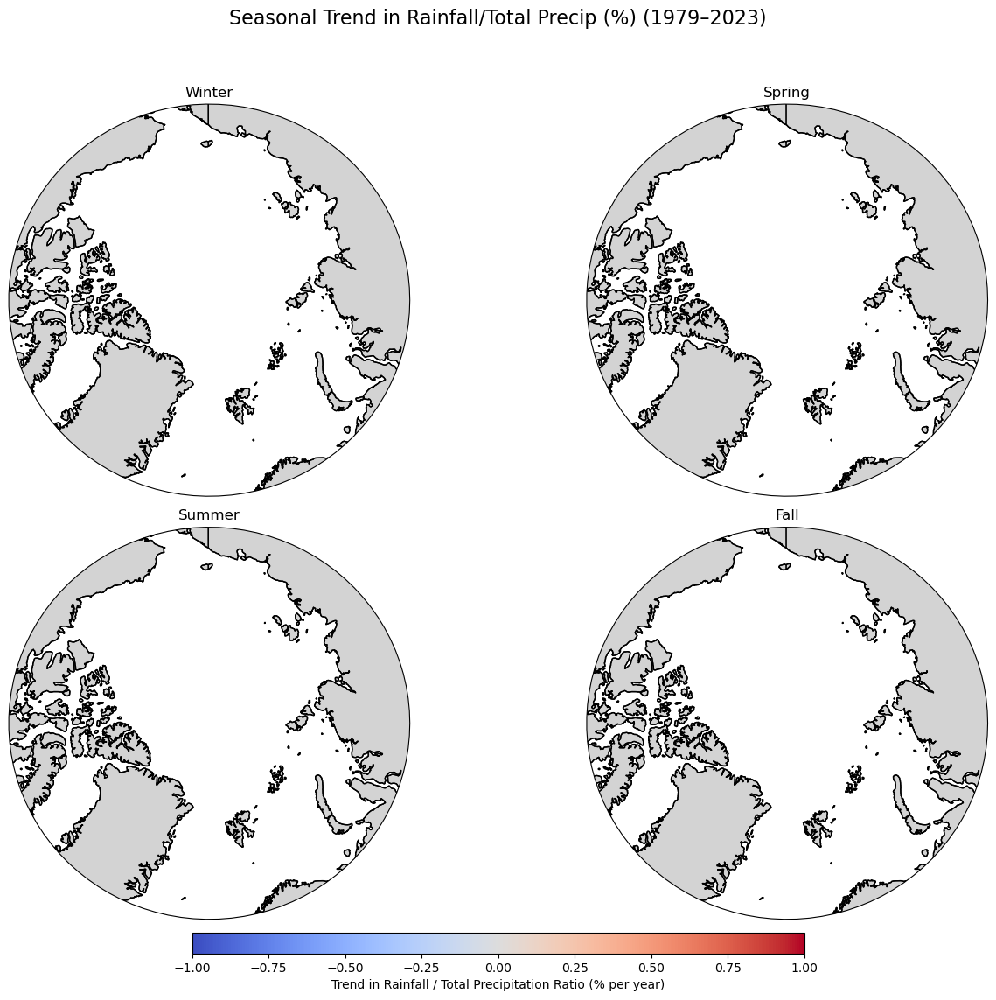

In [162]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
from scipy.stats import linregress

# --- Data Extraction ---
tp = ds['tp']
sf = ds['sf']
tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']

# Compute rainfall (liquid = TP - SF)
rain = (tp - sf).clip(min=0)

# --- Assign Seasonal Labels ---
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), tp['date'].dt.month)
tp.coords['season'] = season_labels
sf.coords['season'] = season_labels
rain.coords['season'] = season_labels

# --- Trend and Significance Calculation ---
def compute_trend_and_pval(da):
    time = da['date'].dt.year.values
    x = time - time.mean()
    y = da.transpose('date', 'latitude', 'longitude').values

    trend = np.full(y.shape[1:], np.nan)
    pval = np.full(y.shape[1:], np.nan)

    for i in range(y.shape[1]):
        for j in range(y.shape[2]):
            y_ij = y[:, i, j]
            if np.all(np.isnan(y_ij)):
                continue
            slope, _, _, p, _ = linregress(x, y_ij)
            trend[i, j] = slope * 100  # % per year
            pval[i, j] = p

    trend_xr = xr.DataArray(trend, coords=[da.latitude, da.longitude], dims=['latitude', 'longitude'])
    pval_xr = xr.DataArray(pval, coords=[da.latitude, da.longitude], dims=['latitude', 'longitude'])
    return trend_xr, pval_xr

# --- Compute Seasonal Trends and Significance ---
trend_maps, pval_maps = [], []
for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    rain_season = rain.where(rain['season'] == season)
    tp_season = tp.where(tp['season'] == season)
    ratio = (rain_season / tp_season.where(tp_season > 0)).clip(0, 1)

    trend, pval = compute_trend_and_pval(ratio)
    trend_maps.append(trend)
    pval_maps.append(pval)

# Combine
trend_da = xr.concat(trend_maps, dim='season')
pval_da = xr.concat(pval_maps, dim='season')
trend_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
pval_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
trend_da.name = 'Rainfall/Total Precip Trend'
trend_da.attrs['units'] = '% per year'

# --- Plotting Function with Hatching ---
def plot_seasonal_trends_with_hatching(trend_data, pval_data,
                                       title="Seasonal Trend in Rainfall/Total Precip (%) (1979–2023)",
                                       cmap='coolwarm', vmin=-1, vmax=1):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic Circle
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = trend_data['season'].values[i]
        dat = trend_data.sel(season=season)
        sig = pval_data.sel(season=season) < 0.05

        # Filled colors
        pcm = ax.pcolormesh(trend_data.longitude, trend_data.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        # Contour lines
        ax.contour(trend_data.longitude, trend_data.latitude, dat,
                   levels=np.arange(-1.0, 1.1, 0.5),
                   colors='black', linewidths=0.4,
                   transform=ccrs.PlateCarree())

        # Hatching where significant
        ax.contourf(trend_data.longitude, trend_data.latitude, sig,
                    levels=[0.5, 1], colors='none',
                    hatches=['////'], transform=ccrs.PlateCarree())

        ax.set_title(season, fontsize=12)

    # Colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Trend in Rainfall / Total Precipitation Ratio (% per year)")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# --- Plot with Hatching ---
plot_seasonal_trends_with_hatching(trend_da, pval_da)


In [168]:
from scipy.stats import linregress

def compute_trend_with_sig(da):
    """
    Computes linear trend and p-value for each grid cell over time.

    Parameters:
        da (xarray.DataArray): 3D DataArray [time, lat, lon] or [date, lat, lon]
    
    Returns:
        slope (xarray.DataArray): Linear trend (slope)
        pval (xarray.DataArray): p-value associated with trend
    """
    # Extract time dimension
    time = da['date'].dt.year
    t = (time - time.mean()).values
    y = da.values  # shape: [time, lat, lon]

    slope = np.full(y.shape[1:], np.nan)
    pval = np.full(y.shape[1:], np.nan)

    for i in range(y.shape[1]):         # latitude
        for j in range(y.shape[2]):     # longitude
            y_ij = y[:, i, j]

            if np.isnan(y_ij).all():
                continue  # Skip fully missing grid cells

            if np.count_nonzero(~np.isnan(y_ij)) < 3:
                continue  # Not enough valid points for regression

            slope_ij, _, _, pval_ij, _ = linregress(t, y_ij)
            slope[i, j] = slope_ij
            pval[i, j] = pval_ij

    # Rebuild as xarray objects
    slope_da = xr.DataArray(slope, dims=('latitude', 'longitude'),
                            coords={'latitude': da.latitude, 'longitude': da.longitude},
                            name='trend', attrs={'units': '% per year'})

    pval_da = xr.DataArray(pval, dims=('latitude', 'longitude'),
                           coords={'latitude': da.latitude, 'longitude': da.longitude},
                           name='pval')

    return slope_da, pval_da


In [169]:
slope_list = []
pval_list = []

for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    rain_season = rain.where(rain['season'] == season)
    tp_season = tp.where(tp['season'] == season)
    ratio = (rain_season / tp_season.where(tp_season > 0)).clip(0, 1)

    trend, pval = compute_trend_with_sig(ratio)
    trend['season'] = season
    pval['season'] = season

    slope_list.append(trend)
    pval_list.append(pval)

trend_da = xr.concat(slope_list, dim='season')
pval_da = xr.concat(pval_list, dim='season')


In [170]:
print(pval_da.min().values, pval_da.max().values)
print(pval_da.isnull().sum().values)


nan nan
696960


In [171]:
print(ratio)
print(ratio.isnull().sum())
print(ratio.mean('date'))


<xarray.DataArray (date: 540, latitude: 121, longitude: 1440)>
array([[[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        ...,
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan]],

       [[          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [          nan,           nan,           nan, ...,
                   nan,           nan,           nan],
        [ 

In [172]:
print(tp_season.mean('date'))
print(rain_season.mean('date'))


<xarray.DataArray 'tp' (latitude: 121, longitude: 1440)>
array([[0.00081899, 0.00081899, 0.00081899, ..., 0.00081899, 0.00081899,
        0.00081899],
       [0.00081875, 0.00081874, 0.00081873, ..., 0.00081883, 0.00081877,
        0.00081871],
       [0.00082303, 0.00082294, 0.00082285, ..., 0.00082316, 0.00082312,
        0.00082301],
       ...,
       [0.00302459, 0.00300549, 0.00298477, ..., 0.00302896, 0.00302721,
        0.00302762],
       [0.00305079, 0.0030424 , 0.00302917, ..., 0.00305705, 0.0030611 ,
        0.00306394],
       [0.00307262, 0.00308702, 0.00307894, ..., 0.0030489 , 0.00305323,
        0.00305836]], dtype=float32)
Coordinates:
    number     int64 0
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... 60.5 60.25 60.0
  * longitude  (longitude) float64 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
<xarray.DataArray (latitude: 121, longitude: 1440)>
array([[1.33796975e-05, 1.33796975e-05, 1.33796975e-05, ...,
        1.33796975e-05, 1.33796975e-05, 1.337969

In [174]:
ratio = (rain_season / tp_season.where((tp_season > 0) & ~np.isnan(rain_season))).clip(0, 1)


In [167]:
pval_winter = pval_da.sel(season='Winter')
print(pval_winter)


<xarray.DataArray (latitude: 121, longitude: 1440)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * latitude   (latitude) float64 90.0 89.75 89.5 89.25 ... 60.5 60.25 60.0
  * longitude  (longitude) float64 -180.0 -179.8 -179.5 ... 179.2 179.5 179.8
    season     <U6 'Winter'


In [175]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
from scipy.stats import linregress

# Example data loading (user should load their own dataset)
# ds = xr.open_dataset("your_file.nc")

# Extract total precipitation and snowfall
tp = ds['tp']
sf = ds['sf']
ds['date'] = pd.to_datetime(ds['date'].values)
tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']

# Compute rainfall (liquid = TP - SF)
rain = (tp - sf).clip(min=0)

# Assign seasonal labels
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), ds['date'].dt.month)
tp.coords['season'] = season_labels
sf.coords['season'] = season_labels
rain.coords['season'] = season_labels

# Trend and significance function
def compute_trend_with_sig(da):
    time = da['date'].dt.year
    t = (time - time.mean()).values
    y = da.values

    slope = np.full(y.shape[1:], np.nan)
    pval = np.full(y.shape[1:], np.nan)

    for i in range(y.shape[1]):
        for j in range(y.shape[2]):
            y_ij = y[:, i, j]
            if np.isnan(y_ij).all() or np.count_nonzero(~np.isnan(y_ij)) < 3:
                continue
            slope_ij, _, _, pval_ij, _ = linregress(t, y_ij)
            slope[i, j] = slope_ij
            pval[i, j] = pval_ij

    slope_da = xr.DataArray(slope, dims=('latitude', 'longitude'),
                            coords={'latitude': da.latitude, 'longitude': da.longitude},
                            name='trend', attrs={'units': '% per year'})

    pval_da = xr.DataArray(pval, dims=('latitude', 'longitude'),
                           coords={'latitude': da.latitude, 'longitude': da.longitude},
                           name='pval')
    return slope_da, pval_da

# Compute trend and p-values by season
seasonal_trends = []
seasonal_pvals = []
for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    rain_season = rain.where(rain['season'] == season)
    tp_season = tp.where(tp['season'] == season)
    ratio = (rain_season / tp_season.where(tp_season > 0)).clip(0, 1)
    slope, pval = compute_trend_with_sig(ratio)
    slope['season'] = season
    pval['season'] = season
    seasonal_trends.append(slope)
    seasonal_pvals.append(pval)

trend_da = xr.concat(seasonal_trends, dim='season')
pval_da = xr.concat(seasonal_pvals, dim='season')


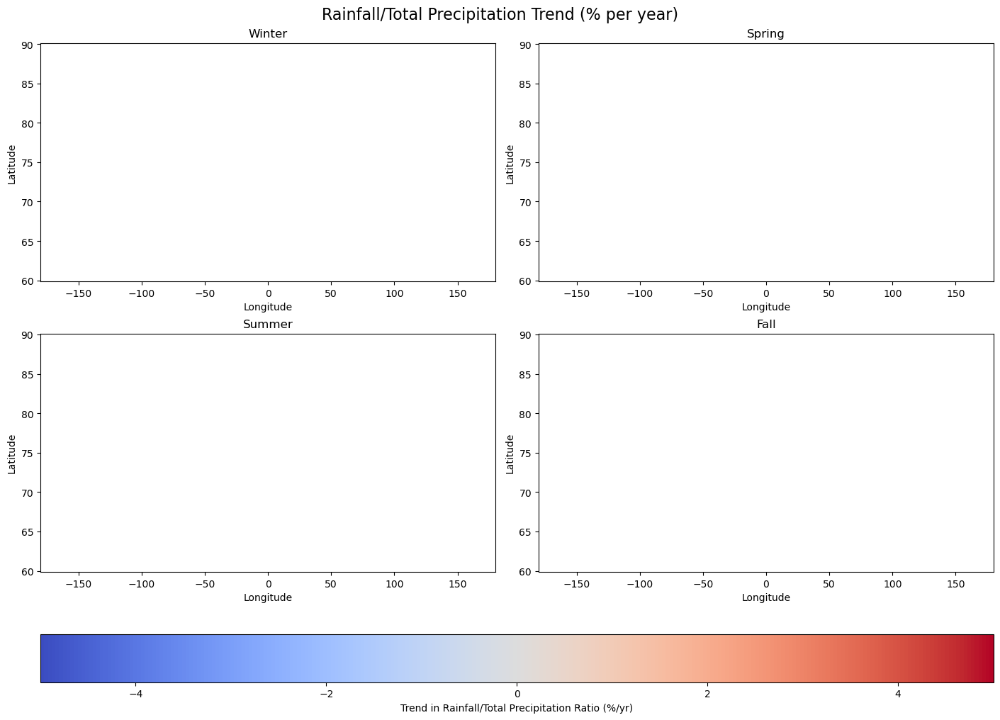

In [181]:
import matplotlib.pyplot as plt

# Simple 2x2 plot of seasonal trends (no Cartopy, basic matplotlib)
def plot_trend_and_significance(trend_da, pval_da, title="Rainfall/Total Precipitation Trend (% per year)"):
    fig, axes = plt.subplots(2, 2, figsize=(14, 10), constrained_layout=True)
    seasons = trend_da['season'].values

    for ax, season in zip(axes.flat, seasons):
        trend = trend_da.sel(season=season)
        pval = pval_da.sel(season=season)

        # Mask non-significant values
        significant_trend = trend.where(pval < 0.5)

        im = ax.pcolormesh(trend.longitude, trend.latitude, significant_trend,
                           cmap='coolwarm', vmin=-5, vmax=5, shading='auto')
        ax.set_title(f"{season}", fontsize=12)
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")

    # Colorbar
    cbar = fig.colorbar(im, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.05)
    cbar.set_label("Trend in Rainfall/Total Precipitation Ratio (%/yr)")

    plt.suptitle(title, fontsize=16)
    plt.show()

# Plot the results
plot_trend_and_significance(trend_da, pval_da)


In [177]:
print("Total valid grid cells per timestep:", ratio.count(dim=['latitude', 'longitude']))
print("Total valid timesteps per grid cell:", ratio.count(dim='date').mean().item())


Total valid grid cells per timestep: <xarray.DataArray (date: 540)>
array([     0,      0,      0,      0,      0,      0,      0,      0,
       174240, 174240, 174240,      0,      0,      0,      0,      0,
            0,      0,      0,      0, 174240, 174240, 174240,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
       174240, 174240, 174240,      0,      0,      0,      0,      0,
            0,      0,      0,      0, 174240, 174240, 174240,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
       174240, 174240, 174240,      0,      0,      0,      0,      0,
            0,      0,      0,      0, 174240, 174240, 174240,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
       174240, 174240, 174240,      0,      0,      0,      0,      0,
            0,      0,      0,      0, 174240, 174240, 174240,      0,
            0,      0,      0,      0,      0,      0,      0,      0,
       17

NameError: name 'df_summary' is not defined

NameError: name 'tools' is not defined

In [182]:
print("Min:", float(ratio.min()), "Max:", float(ratio.max()))


Min: 0.0 Max: 1.0


In [179]:
# Pick central grid point (adjust indices if needed)
sample_ratio = ratio[:, ratio.latitude.size // 2, ratio.longitude.size // 2]
print(sample_ratio)


<xarray.DataArray (date: 540)>
array([       nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan, 0.7582278 , 0.4868791 ,
       0.09011944,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
       0.71088237, 0.29933664, 0.07750302,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan, 0.82134265, 0.36891893, 0.0593047 ,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan,        nan, 0.53216505,
       0.43238586, 0.12900944,        nan,        nan,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan, 0.76446587, 0.29114664, 0.01762957,        nan,
              nan,        nan,        nan,        nan,        nan,
              nan,        nan,        nan, 0.89237666, 0.74154025,
       0.42734808,        nan, 

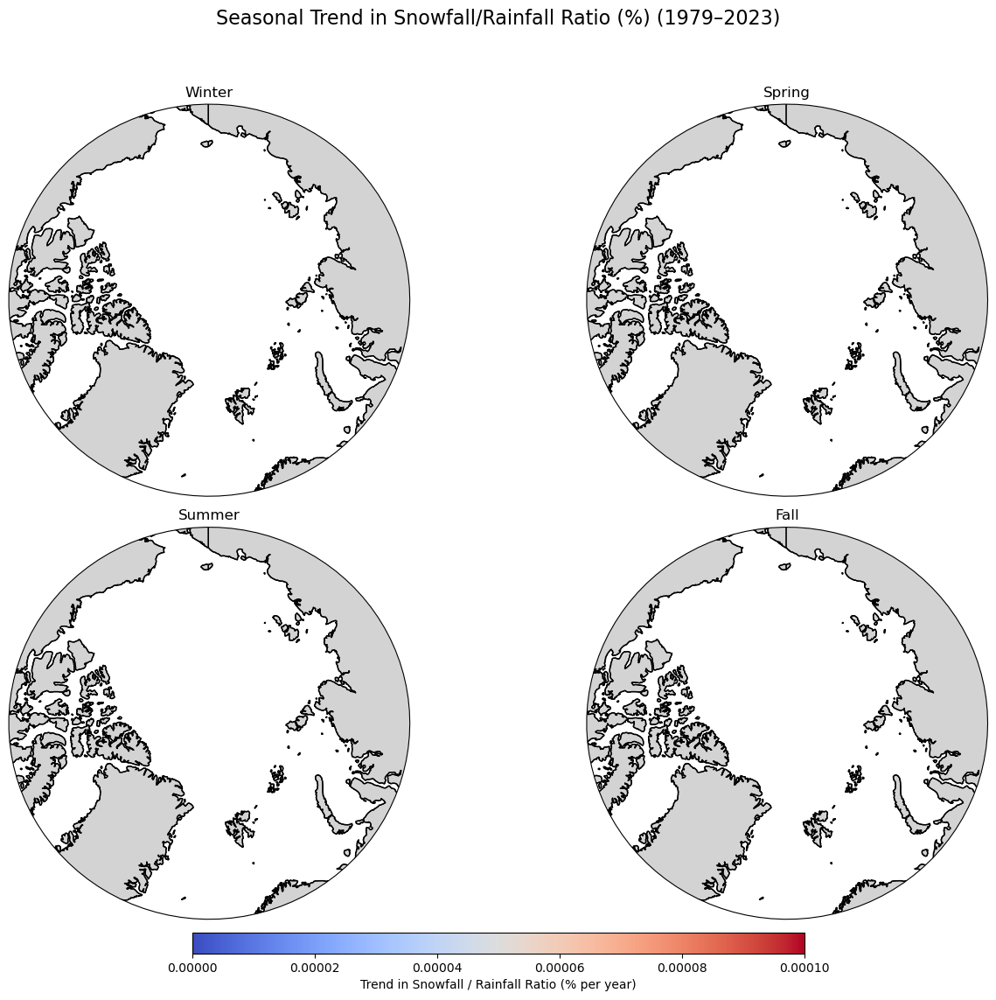

In [68]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
from scipy.ndimage import gaussian_filter

# --- Extract total precipitation and snowfall ---
tp = ds['tp']
sf = ds['sf']
tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']

# Compute Rainfall (Liquid Precipitation = TP - SF)
rain = (tp - sf).clip(min=0)

# --- Assign Seasons ---
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), tp['date'].dt.month)
tp.coords['season'] = season_labels
sf.coords['season'] = season_labels
rain.coords['season'] = season_labels

# --- Define Trend Function ---
def compute_trend_over_time(da):
    years = da['date'].dt.year
    x = years - years.mean()
    slope = ((x * da).mean('date')) / ((x**2).mean())
    return slope

# --- Compute Snowfall / Rainfall Ratio Trend ---
trend_maps = []
for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    sf_season = sf.where(sf['season'] == season)
    rain_season = rain.where(rain['season'] == season)

    ratio = (sf_season / rain_season.where(rain_season > 0.1)).clip(0, 1)
    trend = compute_trend_over_time(ratio)

    # Light smoothing using Gaussian filter
    trend_smoothed = xr.apply_ufunc(
        gaussian_filter, trend,
        kwargs={'sigma': 1.5},  # Adjust sigma for desired smoothness
        input_core_dims=[['latitude', 'longitude']],
        output_core_dims=[['latitude', 'longitude']],
        vectorize=True,
        dask='parallelized',
        output_dtypes=[float]
    )

    # Keep only valid, non-negative values
    trend_clean = trend_smoothed.where(np.isfinite(trend_smoothed) & (trend_smoothed >= 0)).clip(0, 1)
    trend_maps.append(trend_clean)

# Combine into one DataArray
trend_da = xr.concat(trend_maps, dim='season')
trend_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
trend_da.name = 'Snowfall/Rainfall Trend'
trend_da.attrs['units'] = '% per year'

# --- Plotting Function ---
def plot_seasonal_trends(trend_data, title="Seasonal Trend in Snowfall/Rainfall Ratio (%) (1979–2023)",
                         cmap='coolwarm', vmin=0, vmax=0.0001):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = trend_data['season'].values[i]
        dat = trend_data.sel(season=season)

        pcm = ax.pcolormesh(trend_data.longitude, trend_data.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        ax.set_title(season, fontsize=12)

    # Colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Trend in Snowfall / Rainfall Ratio (% per year)")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# --- Plot ---
plot_seasonal_trends(trend_da)



Significance Summary (p < 0.05):

Winter: 0 of 0 grid cells significant (0.00%)
Spring: 0 of 0 grid cells significant (0.00%)
Summer: 0 of 0 grid cells significant (0.00%)
Fall: 0 of 0 grid cells significant (0.00%)


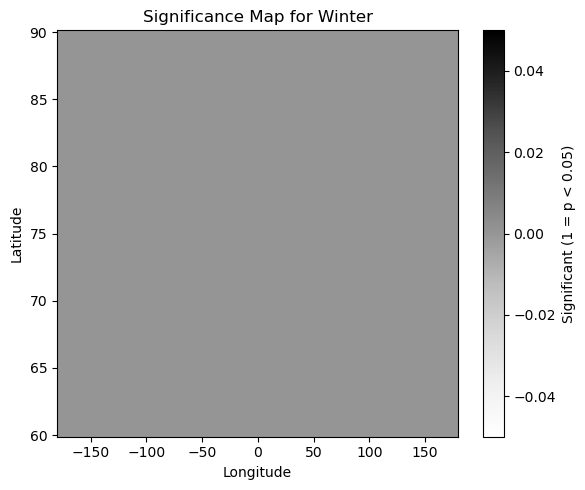

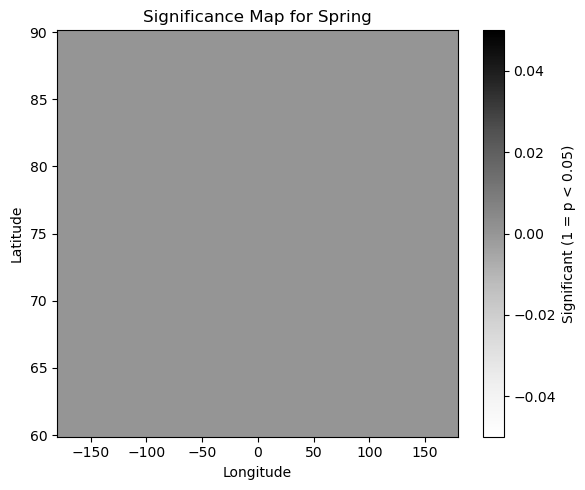

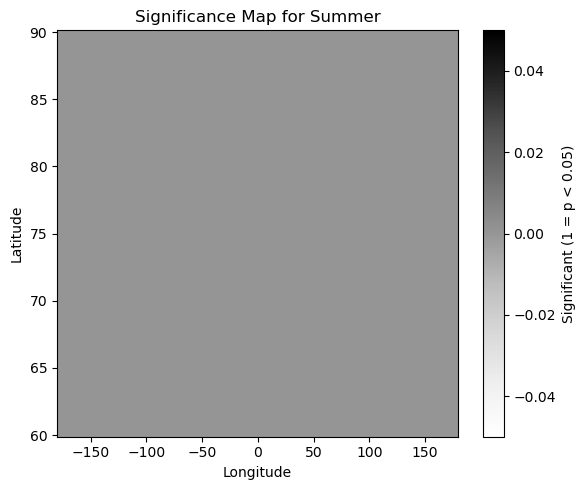

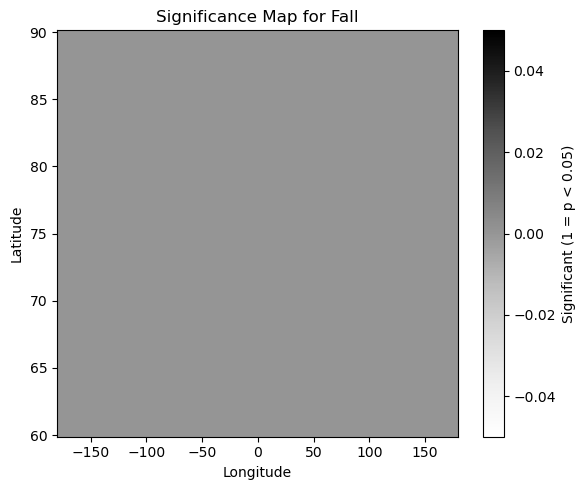

In [163]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# Assuming pval_da is already defined with dimensions: ['season', 'latitude', 'longitude']
# If not yet assigned, do this (after trend + pval computation):
# pval_da = xr.concat(pval_maps, dim='season')
# pval_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']

# --- Print significance count and percentage for each season ---
print("Significance Summary (p < 0.05):\n")
for season in pval_da['season'].values:
    pvals = pval_da.sel(season=season)
    sig_mask = (pvals < 0.05)
    
    num_sig = int(sig_mask.sum().values)
    total_cells = int(np.isfinite(pvals).sum().values)
    percent_sig = 100 * num_sig / total_cells if total_cells > 0 else 0

    print(f"{season}: {num_sig} of {total_cells} grid cells significant ({percent_sig:.2f}%)")

# --- Optional: Plot significance mask for each season ---
for season in pval_da['season'].values:
    sig_mask = (pval_da.sel(season=season) < 0.05).astype(int)
    
    plt.figure(figsize=(6, 5))
    sig_mask.plot(cmap='Greys', cbar_kwargs={'label': 'Significant (1 = p < 0.05)'})
    plt.title(f"Significance Map for {season}")
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.tight_layout()
    plt.show()


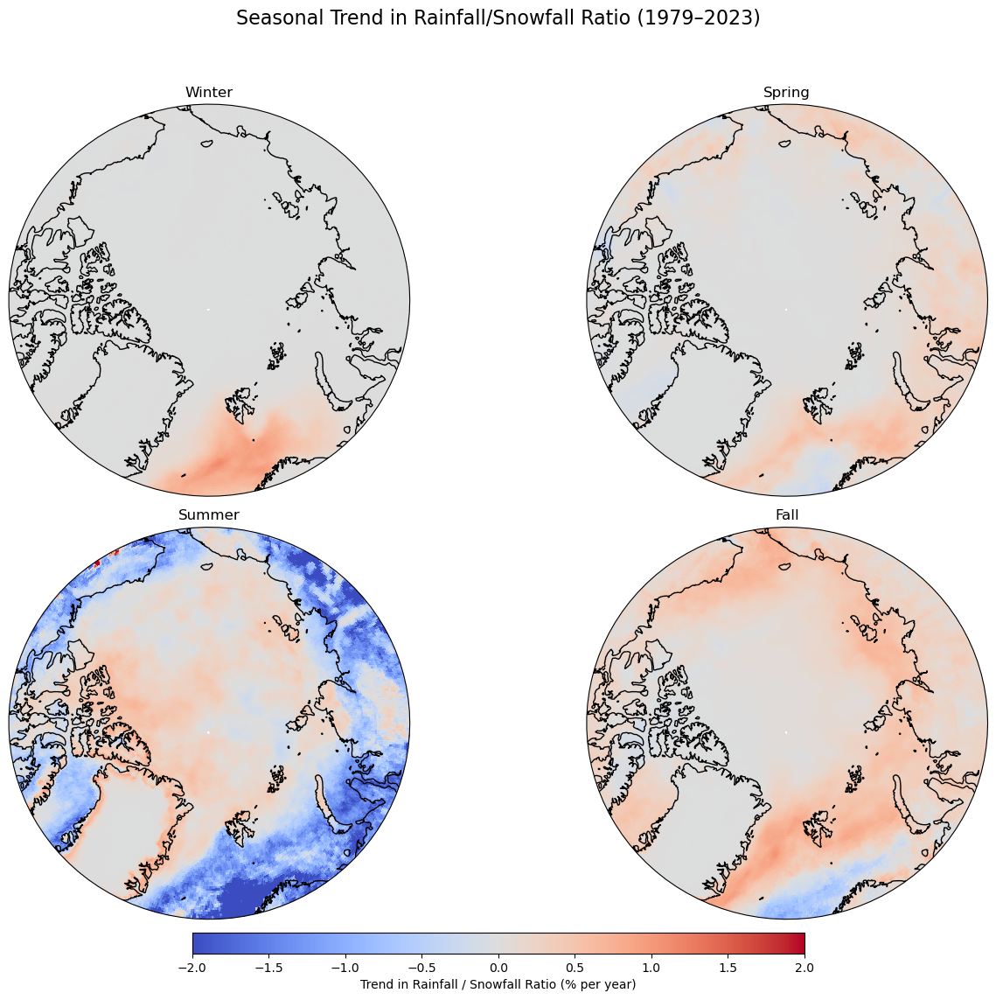

In [19]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath

# Extract total precipitation and snowfall
tp = ds['tp']
sf = ds['sf']
tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']

# Compute rainfall (liquid)
rain = (tp - sf).clip(min=0)

# Assign seasonal labels
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), tp['date'].dt.month)
tp.coords['season'] = season_labels
sf.coords['season'] = season_labels
rain.coords['season'] = season_labels

# Trend calculation
def compute_trend_over_time(da):
    years = da['date'].dt.year
    x = years - years.mean()
    slope = ((x * da).mean('date')) / ((x**2).mean())
    return slope

# Compute trend for each season
trend_maps = []
for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    rain_season = rain.where(rain['season'] == season)
    sf_season = sf.where(sf['season'] == season)
    
    ratio = (rain_season / sf_season.where(sf_season > 0)).clip(0, 1)
    trend = compute_trend_over_time(ratio) * 100  # convert to % per year
    trend_maps.append(trend)

# Combine into one DataArray
trend_da = xr.concat(trend_maps, dim='season')
trend_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
trend_da.name = 'Rainfall/Snowfall Trend'
trend_da.attrs['units'] = '% change per year'

# Plotting function
def plot_seasonal_trends(trend_data, title="Seasonal Trend in Rainfall/Snowfall Ratio (1979–2023)", cmap='coolwarm', vmin=-2, vmax=2):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle boundary
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = trend_data['season'].values[i]
        dat = trend_data.sel(season=season)

        pcm = ax.pcolormesh(trend_data.longitude, trend_data.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        ax.set_title(f"{season}", fontsize=12)

    # Colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Trend in Rainfall / Snowfall Ratio (% per year)")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# Plot
plot_seasonal_trends(trend_da)


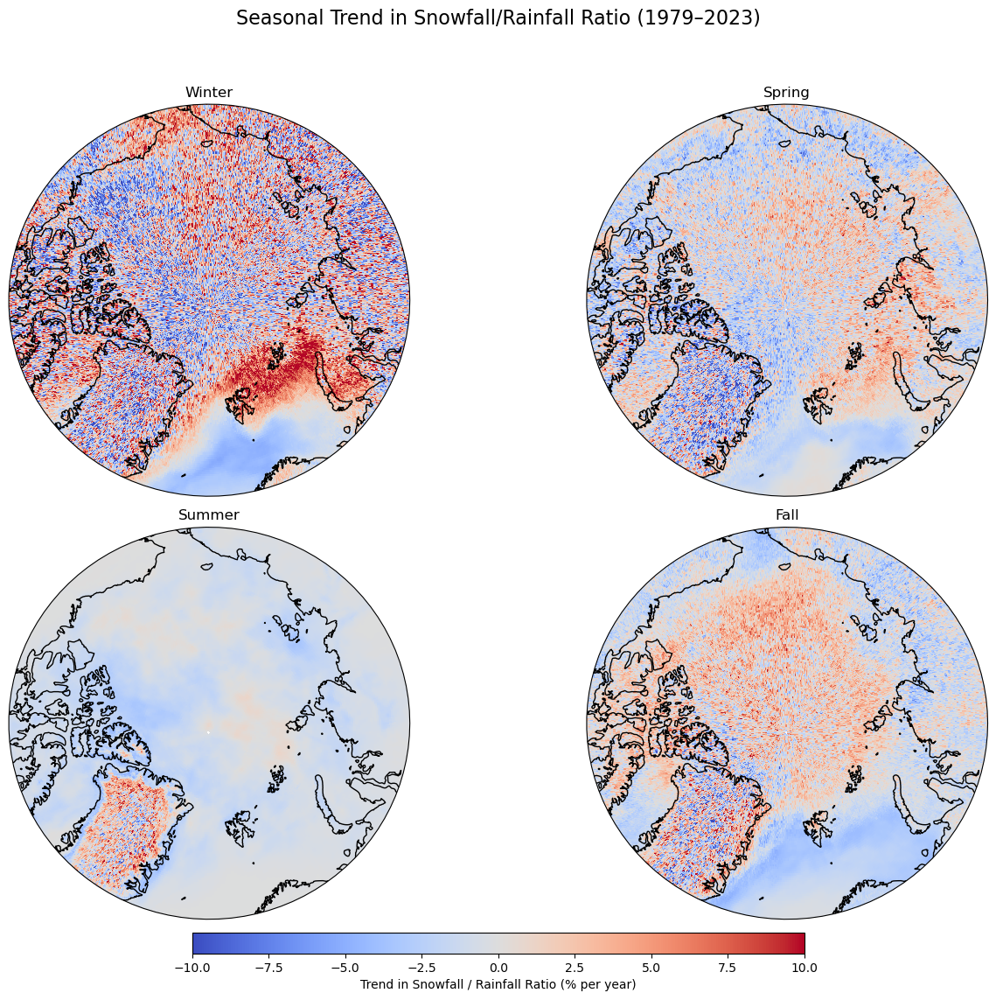

In [70]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath

# ----------------------------------------
# STEP 1: PREP DATA
# ----------------------------------------

tp = ds['tp']
sf = ds['sf']
tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']
rain = (tp - sf).clip(min=0)

# Assign seasonal labels
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), tp['date'].dt.month)
tp.coords['season'] = season_labels
sf.coords['season'] = season_labels
rain.coords['season'] = season_labels

# ----------------------------------------
# STEP 2: COMPUTE TRENDS (NO SIG TESTING)
# ----------------------------------------

def compute_trend_over_time(da):
    years = da['date'].dt.year
    x = years - years.mean()
    slope = ((x * da).mean('date')) / ((x**2).mean())
    return slope * 100  # % per year

trend_maps = []

for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    rain_season = rain.where(rain['season'] == season)
    sf_season = sf.where(sf['season'] == season)

    # Snowfall / Rainfall ratio
    ratio = (sf_season / rain_season.where(rain_season > 0))
    ratio = ratio.where(np.isfinite(ratio))  # drop inf
    ratio = ratio.clip(0, 5)  # optional cap to avoid wild values
    ratio = ratio.transpose("date", "latitude", "longitude")

    trend = compute_trend_over_time(ratio)
    trend_maps.append(trend)

trend_da = xr.concat(trend_maps, dim='season')
trend_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
trend_da.name = 'Snowfall/Rainfall Trend'
trend_da.attrs['units'] = '% change per year'

# ----------------------------------------
# STEP 3: PLOT TRENDS (NO HATCHING)
# ----------------------------------------

def plot_seasonal_trends(trend_data, title="Seasonal Trend in Snowfall/Rainfall Ratio (1979–2023)", cmap='coolwarm', vmin=-10, vmax=10):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle boundary
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = trend_data['season'].values[i]
        dat = trend_data.sel(season=season)

        pcm = ax.pcolormesh(trend_data.longitude, trend_data.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        ax.set_title(f"{season}", fontsize=12)

    # Colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Trend in Snowfall / Rainfall Ratio (% per year)")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# ----------------------------------------
# STEP 4: PLOT
# ----------------------------------------

plot_seasonal_trends(trend_da)



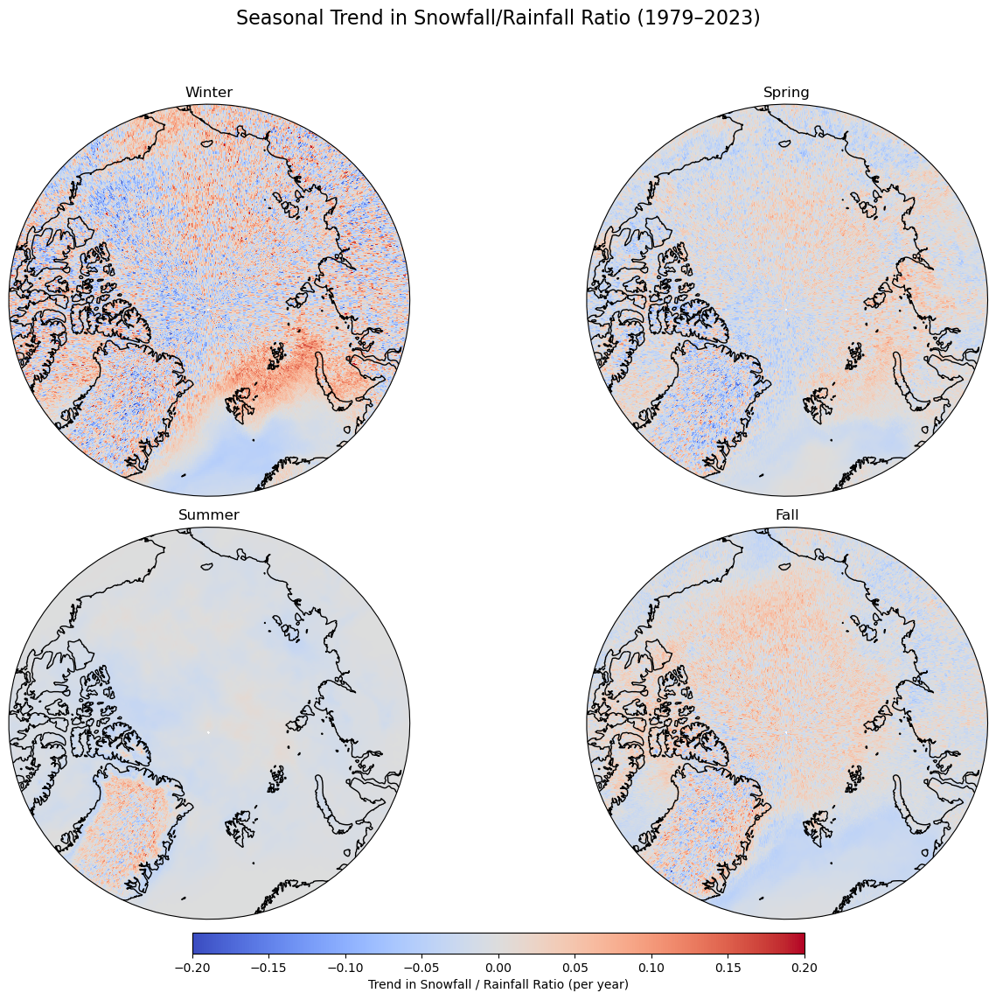

In [37]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath

# -----------------------------
# 1. Setup Variables
# -----------------------------
tp = ds['tp']  # total precip
sf = ds['sf']  # snowfall

tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']

# Rainfall (liquid precipitation)
rain = (tp - sf).clip(min=0)

# -----------------------------
# 2. Assign Seasons
# -----------------------------
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), tp['date'].dt.month)
rain.coords['season'] = season_labels
sf.coords['season'] = season_labels

# -----------------------------
# 3. Trend Function
# -----------------------------
def compute_trend_over_time(da):
    years = da['date'].dt.year
    x = years - years.mean()
    slope = ((x * da).mean('date')) / ((x**2).mean())
    return slope

# -----------------------------
# 4. Compute Snowfall/Rainfall Ratio Trends
# -----------------------------
trend_maps = []

for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    rain_season = rain.where(rain['season'] == season)
    sf_season = sf.where(sf['season'] == season)

    # Avoid divide-by-zero
    ratio = (sf_season / rain_season.where(rain_season > 0))

    # Optional: clip very large values if desired
    ratio = ratio.clip(0, 5)

    trend = compute_trend_over_time(ratio)
    trend_maps.append(trend)

# Combine into 4-season DataArray
trend_da = xr.concat(trend_maps, dim='season')
trend_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
trend_da.name = 'Snowfall/Rainfall Trend'
trend_da.attrs['units'] = 'change per year'

# -----------------------------
# 5. Plotting Function
# -----------------------------
def plot_seasonal_trends(trend_data, title="Seasonal Trend in Snowfall/Rainfall Ratio (1979–2023)", cmap='coolwarm', vmin=-0.2, vmax=0.2):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = trend_data['season'].values[i]
        dat = trend_data.sel(season=season)

        pcm = ax.pcolormesh(trend_data.longitude, trend_data.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        ax.set_title(season, fontsize=12)

    # Shared colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Trend in Snowfall / Rainfall Ratio (per year)")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# -----------------------------
# 6. Run Plot
# -----------------------------
plot_seasonal_trends(trend_da)


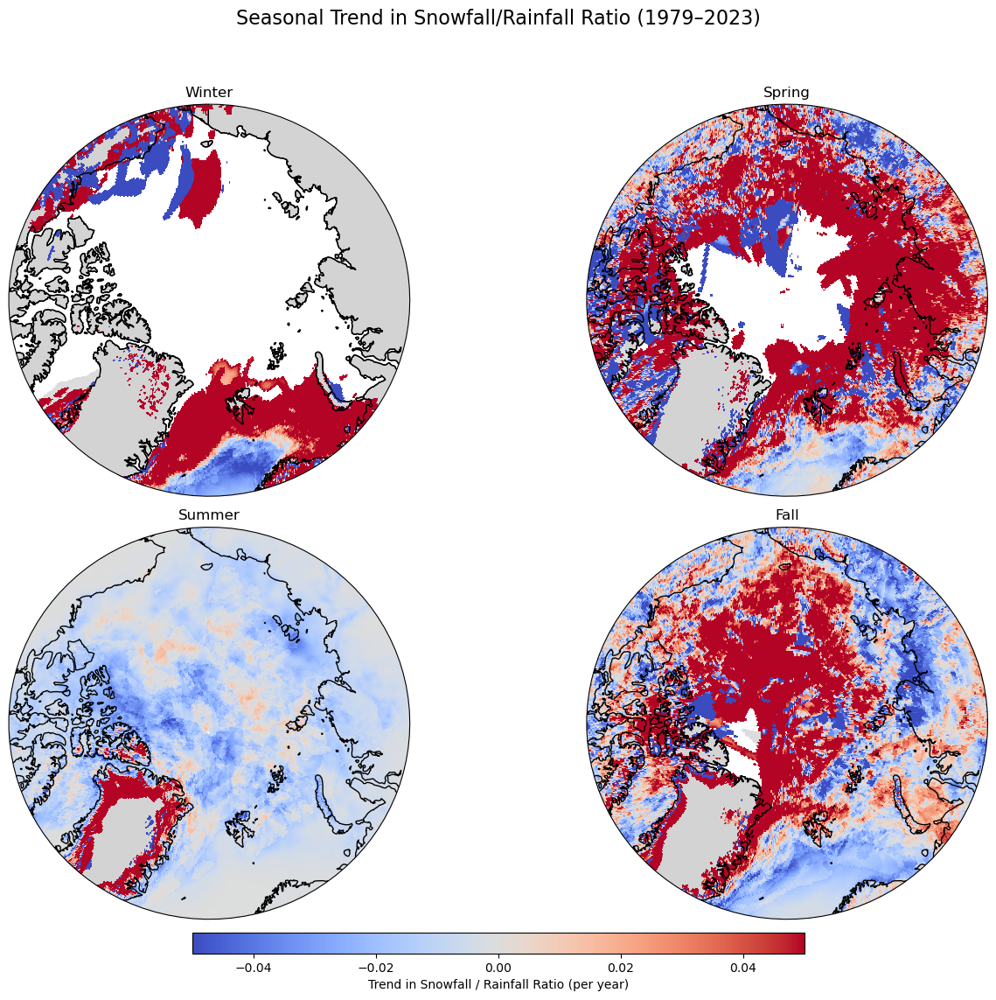

In [36]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath

# -----------------------------
# 1. Setup Variables
# -----------------------------
tp = ds['tp']  # total precipitation
sf = ds['sf']  # snowfall

tp.coords['date'] = ds['date']
sf.coords['date'] = ds['date']

# Rainfall (liquid precipitation)
rain = (tp - sf).clip(min=0)

# -----------------------------
# 2. Assign Seasons
# -----------------------------
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season, otypes=[str]), tp['date'].dt.month)
rain.coords['season'] = season_labels
sf.coords['season'] = season_labels

# -----------------------------
# 3. Trend Function
# -----------------------------
def compute_trend_over_time(da):
    years = da['date'].dt.year
    x = years - years.mean()
    slope = ((x * da).mean('date')) / ((x**2).mean())
    return slope

# -----------------------------
# 4. Compute Seasonal Trends
# -----------------------------
trend_maps = []

for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    rain_season = rain.where(rain['season'] == season)
    sf_season = sf.where(sf['season'] == season)

    # Avoid divide-by-zero and clip extreme ratios
    ratio = (sf_season / rain_season.where(rain_season > 0))
    ratio = ratio.where(ratio < 10)  # clip extreme outliers if needed

    trend = compute_trend_over_time(ratio)
    trend_maps.append(trend)

# Combine into seasonal DataArray
trend_da = xr.concat(trend_maps, dim='season')
trend_da['season'] = ['Winter', 'Spring', 'Summer', 'Fall']
trend_da.name = 'Snowfall/Rainfall Trend'
trend_da.attrs['units'] = 'change per year'

# -----------------------------
# 5. Plotting Function
# -----------------------------
def plot_seasonal_trends(trend_data,
                         title="Seasonal Trend in Snowfall/Rainfall Ratio (1979–2023)",
                         cmap='coolwarm', vmin=-0.05, vmax=0.05):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circular boundary
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = trend_data['season'].values[i]
        dat = trend_data.sel(season=season)

        pcm = ax.pcolormesh(trend_data.longitude, trend_data.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        ax.set_title(season, fontsize=12)

    # Shared colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Trend in Snowfall / Rainfall Ratio (per year)")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# -----------------------------
# 6. Run the Plot
# -----------------------------
plot_seasonal_trends(trend_da)


In [20]:
print("TP:", tp.shape, tp.values.min(), tp.values.max())
print("SF:", sf.shape, sf.values.min(), sf.values.max())
print("RAIN:", rain.shape, rain.values.min(), rain.values.max())


TP: (540, 121, 1440) 0.0 0.043066025
SF: (540, 121, 1440) 0.0 0.032839775
RAIN: (540, 121, 1440) 0.0 0.042850494


In [37]:
tp_mm = tp * 1000
sf_mm = sf * 1000
rain_mm = rain * 1000


In [38]:
print("TP:", tp.shape, tp.values.min(), tp.values.max())
print("SF:", sf.shape, sf.values.min(), sf.values.max())
print("RAIN:", rain.shape, rain.values.min(), rain.values.max())


TP: (540, 121, 1440) 0.0 0.043066025
SF: (540, 121, 1440) 0.0 0.032839775
RAIN: (540, 121, 1440) 0.0 0.042850494


In [39]:
print("TP Trend range:", np.nanmin(tp_trend.values), np.nanmax(tp_trend.values))
print("SF Trend range:", np.nanmin(sf_trend.values), np.nanmax(sf_trend.values))
print("RAIN Trend range:", np.nanmin(rain_trend.values), np.nanmax(rain_trend.values))


TP Trend range: -2.632108654010478e-05 4.9620267326076934e-05
SF Trend range: -3.5249341408516286e-05 4.6559201032381476e-05
RAIN Trend range: -1.6275374157469455e-05 3.803548029655434e-05


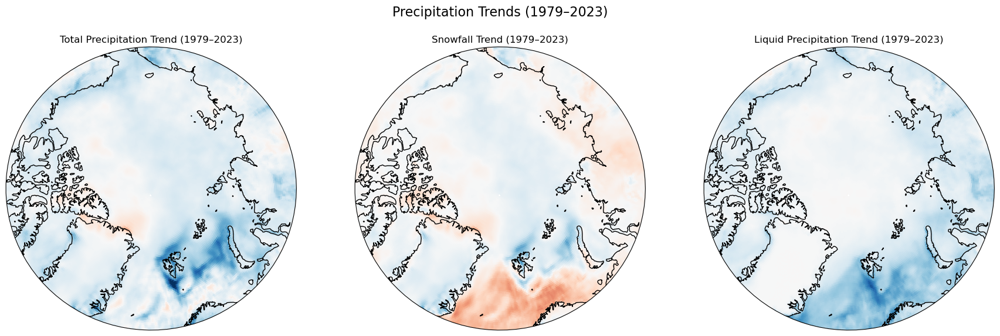

In [38]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath

# --------- 1. Prep ---------
# Assume you loaded your data and assigned:
# tp = ds['tp']    # total precipitation (m)
# sf = ds['sf']    # snowfall (m)
# date already converted to datetime64

rain = (tp - sf).clip(min=0)

# Time axis as numeric years from 0
years = tp['date'].dt.year
time_nums = (years - years[0]).values  # 0 to N

# --------- 2. Trend Function ---------
def compute_trend(da):
    y = da.values  # shape (time, lat, lon)
    t = time_nums
    trend = np.full(y.shape[1:], np.nan)

    for i in range(y.shape[1]):
        for j in range(y.shape[2]):
            y_ij = y[:, i, j]
            if np.all(np.isnan(y_ij)):
                continue
            coeffs = np.polyfit(t[~np.isnan(y_ij)], y_ij[~np.isnan(y_ij)], deg=1)
            trend[i, j] = coeffs[0]  # slope in m/year

    return xr.DataArray(trend, dims=("latitude", "longitude"),
                        coords={"latitude": da.latitude, "longitude": da.longitude})

# --------- 3. Compute Trends ---------
tp_trend = compute_trend(tp)
sf_trend = compute_trend(sf)
rain_trend = compute_trend(rain)

# Convert to mm/year
tp_trend *= 1000
sf_trend *= 1000
rain_trend *= 1000

# --------- 4. Plotting Function ---------
def plot_3panel_trends(tp_trend, sf_trend, rain_trend, title):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    cmap = 'RdBu'
    vmin, vmax = -0.02, 0.02  # mm/year

    trend_data = [tp_trend, sf_trend, rain_trend]
    titles = ['Total Precipitation Trend (1979–2023)',
              'Snowfall Trend (1979–2023)',
              'Liquid Precipitation Trend (1979–2023)']

    for ax, data, t in zip(axes, trend_data, titles):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle boundary
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack((np.cos(theta), np.sin(theta))).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        # Plot
        pcm = ax.pcolormesh(data.longitude, data.latitude, data,
                            transform=ccrs.PlateCarree(), cmap=cmap, shading='auto',
                            vmin=vmin, vmax=vmax)
        ax.set_title(t, fontsize=12)

    # Shared colorbar
    #cbar = fig.colorbar(pcm, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.05)
    #cbar.set_label('Trend (mm/year)')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# --------- 5. Plot It ---------
plot_3panel_trends(tp_trend, sf_trend, rain_trend, "Precipitation Trends (1979–2023)")


In [22]:
import numpy as np
from scipy.stats import linregress

# Create a time series with a small trend and noise
np.random.seed(0)
years = np.arange(1979, 2024)
n_years = len(years)
data = 0.01 * (years - 1979) + np.random.normal(0, 0.01, n_years)  # 0.01 mm/year trend + noise

# Perform linear regression
slope, intercept, r_value, p_value, std_err = linregress(years, data)

slope, p_value


(0.009718064558054627, 7.385748016839069e-48)

In [23]:
from scipy.stats import linregress

def compute_trend_with_sig(da):
    """Compute linear trend (mm/year) and p-value significance mask."""
    y = da.values  # (time, lat, lon)
    t = time_nums
    slope = np.full(y.shape[1:], np.nan)
    pval = np.full(y.shape[1:], np.nan)

    for i in range(y.shape[1]):
        for j in range(y.shape[2]):
            y_ij = y[:, i, j]
            if np.all(np.isnan(y_ij)):
                continue
            res = linregress(t[~np.isnan(y_ij)], y_ij[~np.isnan(y_ij)])
            slope[i, j] = res.slope * 1000  # convert m/year to mm/year
            pval[i, j] = res.pvalue

    slope_da = xr.DataArray(slope, dims=("latitude", "longitude"),
                            coords={"latitude": da.latitude, "longitude": da.longitude})
    pval_da = xr.DataArray(pval, dims=("latitude", "longitude"),
                           coords={"latitude": da.latitude, "longitude": da.longitude})

    return slope_da, pval_da


In [24]:
tp_trend, tp_p = compute_trend_with_sig(tp)
sf_trend, sf_p = compute_trend_with_sig(sf)
rain_trend, rain_p = compute_trend_with_sig(rain)


NameError: name 'time_nums' is not defined

In [25]:
for ax, data, pval, t in zip(axes, trend_data, pval_data, titles):
    ax.set_global()
    ax.coastlines()
    ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
    ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

    # Arctic circle boundary
    theta = np.linspace(0, 2 * np.pi, 100)
    circle = mpath.Path(np.vstack((np.cos(theta), np.sin(theta))).T * 0.5 + 0.5)
    ax.set_boundary(circle, transform=ax.transAxes)

    # Masked data
    data_masked = data.where(pval < 0.05)

    # Plot
    pcm = ax.pcolormesh(data.longitude, data.latitude, data_masked,
                        transform=ccrs.PlateCarree(), cmap=cmap, shading='auto',
                        vmin=vmin, vmax=vmax)
    ax.set_title(t, fontsize=12)


NameError: name 'axes' is not defined

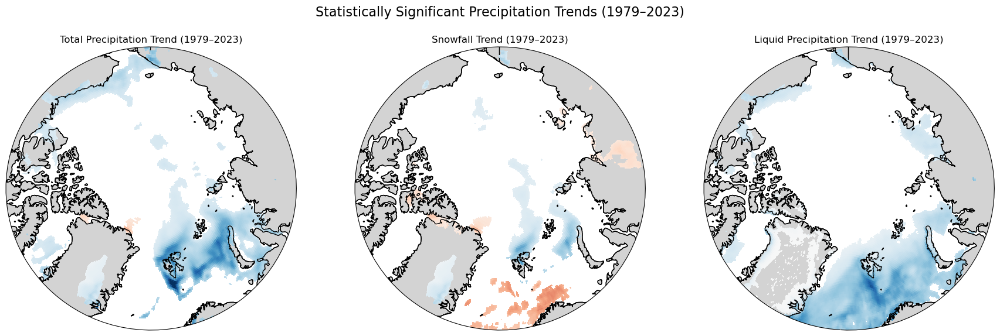

In [91]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
from scipy.stats import linregress

# --- 1. Prep ---
# tp = ds['tp']   # total precipitation (m)
# sf = ds['sf']   # snowfall (m)
rain = (tp - sf).clip(min=0)

# Numeric time for regression
years = tp['date'].dt.year
time_nums = (years - years[0]).values

# --- 2. Trend + Significance Function ---
def compute_trend_with_sig(da):
    y = da.values
    t = time_nums
    slope = np.full(y.shape[1:], np.nan)
    pval = np.full(y.shape[1:], np.nan)

    for i in range(y.shape[1]):
        for j in range(y.shape[2]):
            y_ij = y[:, i, j]
            if np.all(np.isnan(y_ij)):
                continue
            res = linregress(t[~np.isnan(y_ij)], y_ij[~np.isnan(y_ij)])
            slope[i, j] = res.slope * 1000  # m/year → mm/year
            pval[i, j] = res.pvalue

    slope_da = xr.DataArray(slope, dims=("latitude", "longitude"),
                            coords={"latitude": da.latitude, "longitude": da.longitude})
    pval_da = xr.DataArray(pval, dims=("latitude", "longitude"),
                           coords={"latitude": da.latitude, "longitude": da.longitude})
    return slope_da, pval_da

# --- 3. Compute Trends and P-Values ---
tp_trend, tp_pval = compute_trend_with_sig(tp)
sf_trend, sf_pval = compute_trend_with_sig(sf)
rain_trend, rain_pval = compute_trend_with_sig(rain)

# --- 4. Plotting Function with Significance Mask ---
def plot_3panel_sig(tp_trend, sf_trend, rain_trend, tp_pval, sf_pval, rain_pval, title):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    cmap = 'RdBu'
    vmin, vmax = -0.02, 0.02

    trends = [tp_trend, sf_trend, rain_trend]
    pvals = [tp_pval, sf_pval, rain_pval]
    titles = ['Total Precipitation Trend (1979–2023)',
              'Snowfall Trend (1979–2023)',
              'Liquid Precipitation Trend (1979–2023)']

    for ax, trend, pval, t in zip(axes, trends, pvals, titles):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack((np.cos(theta), np.sin(theta))).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        # Only plot significant values
        trend_masked = trend.where(pval < 0.05)

        pcm = ax.pcolormesh(trend.longitude, trend.latitude, trend_masked,
                            transform=ccrs.PlateCarree(), cmap=cmap, shading='auto',
                            vmin=vmin, vmax=vmax)
        ax.set_title(t, fontsize=12)

    # Shared colorbar
    #cbar = fig.colorbar(pcm, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.05)
    #cbar.set_label('Trend (mm/year)')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# --- 5. Run the Plot ---
plot_3panel_sig(tp_trend, sf_trend, rain_trend,
                tp_pval, sf_pval, rain_pval,
                "Statistically Significant Precipitation Trends (1979–2023)")


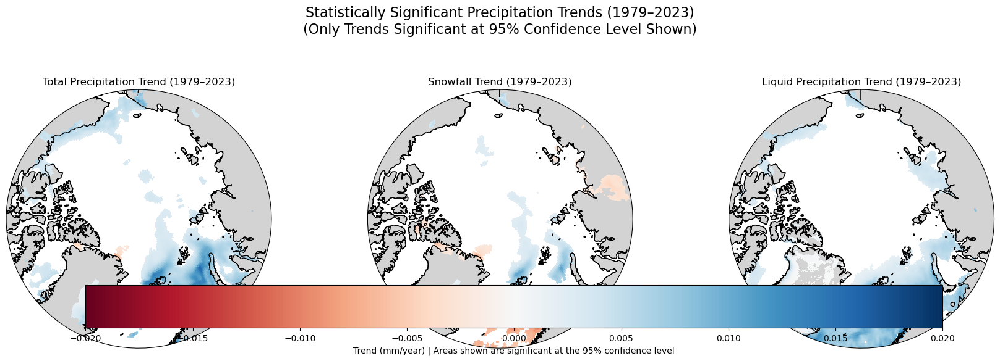

In [146]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
from scipy.stats import linregress

# --- 1. Prep ---
# Assuming you already have 'tp' (total precipitation) and 'sf' (snowfall)
rain = (tp - sf).clip(min=0)

# Numeric time for regression
years = tp['date'].dt.year
time_nums = (years - years[0]).values

# --- 2. Trend + Significance Function ---
def compute_trend_with_sig(da):
    y = da.values
    t = time_nums
    slope = np.full(y.shape[1:], np.nan)
    pval = np.full(y.shape[1:], np.nan)

    for i in range(y.shape[1]):
        for j in range(y.shape[2]):
            y_ij = y[:, i, j]
            if np.all(np.isnan(y_ij)):
                continue
            res = linregress(t[~np.isnan(y_ij)], y_ij[~np.isnan(y_ij)])
            slope[i, j] = res.slope * 1000  # Convert m/year to mm/year
            pval[i, j] = res.pvalue

    slope_da = xr.DataArray(slope, dims=("latitude", "longitude"),
                            coords={"latitude": da.latitude, "longitude": da.longitude})
    pval_da = xr.DataArray(pval, dims=("latitude", "longitude"),
                           coords={"latitude": da.latitude, "longitude": da.longitude})
    return slope_da, pval_da

# --- 3. Compute Trends and P-Values ---
tp_trend, tp_pval = compute_trend_with_sig(tp)
sf_trend, sf_pval = compute_trend_with_sig(sf)
rain_trend, rain_pval = compute_trend_with_sig(rain)

# --- 4. Plotting Function with Confidence Level ---
def plot_3panel_sig(tp_trend, sf_trend, rain_trend, tp_pval, sf_pval, rain_pval, title):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    cmap = 'RdBu'
    vmin, vmax = -0.02, 0.02

    trends = [tp_trend, sf_trend, rain_trend]
    pvals = [tp_pval, sf_pval, rain_pval]
    titles = ['Total Precipitation Trend (1979–2023)',
              'Snowfall Trend (1979–2023)',
              'Liquid Precipitation Trend (1979–2023)']

    for ax, trend, pval, t in zip(axes, trends, pvals, titles):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle boundary
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack((np.cos(theta), np.sin(theta))).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        # Mask non-significant trends
        trend_masked = trend.where(pval < 0.05)

        pcm = ax.pcolormesh(trend.longitude, trend.latitude, trend_masked,
                            transform=ccrs.PlateCarree(), cmap=cmap, shading='auto',
                            vmin=vmin, vmax=vmax)
        ax.set_title(t, fontsize=12)

    # Shared colorbar with confidence level annotation
    cbar = fig.colorbar(pcm, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.05)
    cbar.set_label('Trend (mm/year) | Areas shown are significant at the 95% confidence level')

    plt.suptitle(f"{title}\n(Only Trends Significant at 95% Confidence Level Shown)", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.92])
    plt.show()

# --- 5. Run the Plot ---
plot_3panel_sig(tp_trend, sf_trend, rain_trend,
                tp_pval, sf_pval, rain_pval,
                "Statistically Significant Precipitation Trends (1979–2023)")


In [101]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath

def plot_3panel_significant_only(tp_trend, sf_trend, rain_trend,
                                  tp_pval, sf_pval, rain_pval,
                                  title):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    cmap = 'RdBu'
    vmin, vmax = -0.02, 0.02

    trends = [tp_trend, sf_trend, rain_trend]
    pvals = [tp_pval, sf_pval, rain_pval]
    titles = ['Total Precipitation Trend (1979–2023)',
              'Snowfall Trend (1979–2023)',
              'Liquid Precipitation Trend (1979–2023)']

    for ax, trend, pval, t in zip(axes, trends, pvals, titles):
        ax.set_title(t, fontsize=11)
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS, linewidth=0.5)

        # Define circular boundary
        theta = np.linspace(0, 2 * np.pi, 100)
        center, radius = [0.5, 0.5], 0.5
        verts = np.vstack([np.sin(theta), np.cos(theta)]).T
        circle = mpath.Path(verts * radius + center)
        ax.set_boundary(circle, transform=ax.transAxes)

        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Mask out non-significant trends
        sig_mask = pval < 0.05
        trend_masked = trend.where(sig_mask)

        # Plot
        pp = ax.pcolormesh(trend.longitude, trend.latitude, trend_masked,
                           transform=ccrs.PlateCarree(), cmap=cmap, vmin=vmin, vmax=vmax)

    # Colorbar
    cbar_ax = fig.add_axes([0.25, 0.1, 0.5, 0.03])
    cbar = fig.colorbar(pp, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Trend (fraction per year)')

    # Main title
    plt.suptitle(title, fontsize=14, y=0.95)
    plt.tight_layout(rect=[0, 0.12, 1, 0.93])
    plt.show()


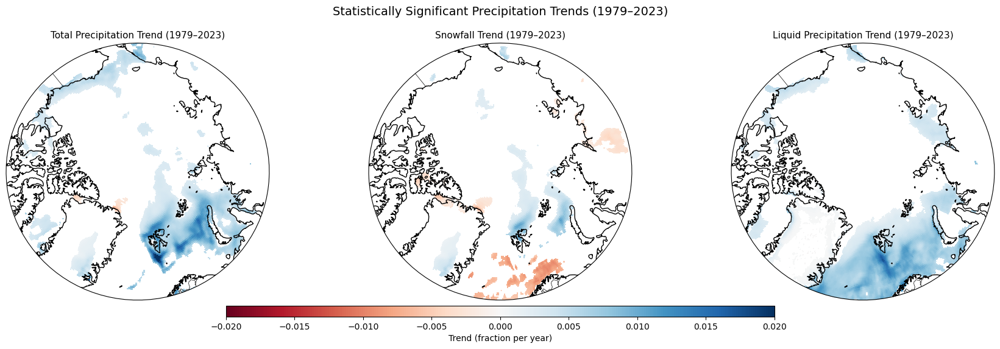

In [102]:
plot_3panel_significant_only(
    tp_trend, sf_trend, rain_trend,
    tp_pval, sf_pval, rain_pval,
    'Statistically Significant Precipitation Trends (1979–2023)'
)


In [30]:
import numpy as np
import xarray as xr
from scipy.stats import linregress

def compute_trend_and_pval(data, time_dim='time'):
    """
    Compute linear trend and p-value over the specified time dimension.
    """
    time_nums = data[time_dim].astype('datetime64[Y]').astype(int)
    trend = xr.full_like(data.isel({time_dim: 0}), np.nan)
    pval = xr.full_like(data.isel({time_dim: 0}), np.nan)

    for i in range(data.lat.size):
        for j in range(data.lon.size):
            y = data[:, i, j]
            if np.isnan(y).all():
                continue
            slope, _, _, p, _ = linregress(time_nums, y)
            trend[i, j] = slope
            pval[i, j] = p

    return trend, pval


In [33]:
from scipy.stats import linregress

def calc_trend_pval(xr_data, time_dim='time'):
    years = xr_data[time_dim].dt.year
    time_nums = years - years.min()

    def linregress_trend(y):
        mask = np.isfinite(y)
        if mask.sum() < 2:
            return np.nan, np.nan
        slope, _, _, pval, _ = linregress(time_nums[mask], y[mask])
        return slope, pval

    stacked = xr_data.stack(z=('latitude', 'longitude'))
    results = np.array([linregress_trend(stacked[:, i].values) for i in range(stacked.shape[1])])
    trend = xr.DataArray(results[:, 0], coords=[stacked.z], dims='z').unstack('z')
    pval = xr.DataArray(results[:, 1], coords=[stacked.z], dims='z').unstack('z')
    return trend, pval


In [34]:
# Example: compute % of area with significant trends
def summarize_significance(pval, label):
    sig_mask = pval < 0.05
    total_points = np.isfinite(pval).sum()
    sig_points = sig_mask.sum()
    print(f"{label}: {sig_points.item()} of {total_points.item()} grid points significant ({(sig_points/total_points).item()*100:.2f}%)")

summarize_significance(tp_pval, "Total Precip")
summarize_significance(sf_pval, "Snowfall")
summarize_significance(rain_pval, "Rainfall")


Total Precip: 24816 of 174240 grid points significant (14.24%)
Snowfall: 19346 of 174240 grid points significant (11.10%)
Rainfall: 29474 of 174240 grid points significant (16.92%)


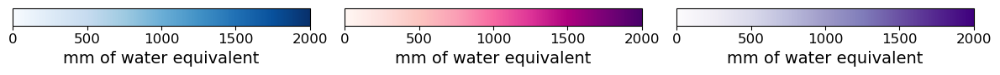

In [90]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 3, figsize=(12, 1))

# Dummy data for each colorbar
vmin, vmax = 0, 2000
norm = plt.Normalize(vmin, vmax)

# Colormaps
cmaps = ['Blues', 'RdPu', 'Purples']
titles = ['mm of water equivalent'] * 3

for i, ax in enumerate(axes):
    cmap = plt.get_cmap(cmaps[i])
    cb = plt.colorbar(
        plt.cm.ScalarMappable(norm=norm, cmap=cmap),
        cax=ax,
        orientation='horizontal'
    )

    # Make tick labels larger
    cb.ax.tick_params(labelsize=12)
    cb.set_label(titles[i], fontsize=14)

plt.tight_layout()
plt.show()


In [113]:
# Assuming `tp` is total precipitation and `sf` is snowfall
rain = (tp - sf).clip(min=0)  # Liquid precipitation
seasonal_rain_ratio = rain / tp.where(tp != 0)  # Avoid division by zero


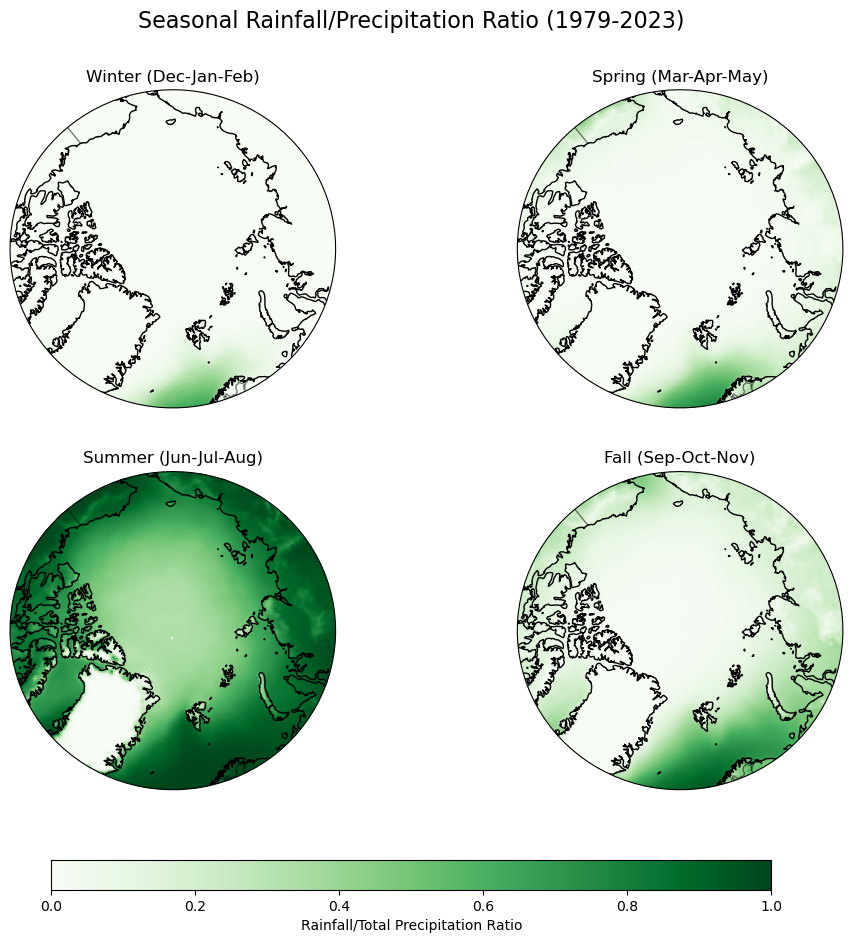

In [114]:
# Function to plot seasonal data with contour lines
def plot_seasonal_maps(data, title_prefix, cmap='Greens', vmin=0, vmax=1):
    fig, axes = plt.subplots(2, 2, figsize=(12, 10), subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})
    seasons = {
        'Winter (Dec-Jan-Feb)': [12, 1, 2],
        'Spring (Mar-Apr-May)': [3, 4, 5],
        'Summer (Jun-Jul-Aug)': [6, 7, 8],
        'Fall (Sep-Oct-Nov)': [9, 10, 11]
    }
    
    for ax, (season, months) in zip(axes.flat, seasons.items()):
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.5)

        # Define a circular boundary for the polar projection
        theta = np.linspace(0, 2 * np.pi, 100)
        center, radius = [0.5, 0.5], 0.5
        verts = np.vstack([np.sin(theta), np.cos(theta)]).T
        circle = mpath.Path(verts * radius + center)
        ax.set_boundary(circle, transform=ax.transAxes)
        
        # Set extent (focus on the Arctic)
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())
        
        # Filter the data for the specific season
        season_data = data.sel(date=data['date'].dt.month.isin(months)).mean(dim='date')

        # Plot the data
        pp = ax.pcolormesh(season_data.longitude, season_data.latitude, season_data, transform=ccrs.PlateCarree(),
                           cmap=cmap, vmin=vmin, vmax=vmax)

        # Add contour lines
        #contours = ax.contour(season_data.longitude, season_data.latitude, season_data, transform=ccrs.PlateCarree(),
                              #colors='black', linewidths=0.5, levels=np.linspace(vmin, vmax, 10))
        
        # Add title for each season
        ax.set_title(season)

    # Adjust layout to ensure space for the color bar
    plt.subplots_adjust(bottom=0.2, top=0.9)

    # Add a color bar below the entire figure using a dedicated axis
    cbar_ax = fig.add_axes([0.2, 0.1, 0.6, 0.03])  # Adjust left, bottom, width, height as needed
    cbar = fig.colorbar(pp, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Rainfall/Total Precipitation Ratio')

    # Set the title for the whole figure
    plt.suptitle(f'{title_prefix} (1979-2023)', fontsize=16)
    plt.show()

# Call the function to generate seasonal maps with viridis colormap and contour lines
plot_seasonal_maps(seasonal_rain_ratio, 'Seasonal Rainfall/Precipitation Ratio')



In [115]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath

# 1. Create rainfall ratio
rain = (tp - sf).clip(min=0)
seasonal_rain_ratio = rain / tp.where(tp != 0)

# 2. Assign season labels
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season), seasonal_rain_ratio['date'].dt.month)
seasonal_rain_ratio.coords['season'] = season_labels
seasonal_rain_ratio.coords['year'] = seasonal_rain_ratio['date'].dt.year

# 3. Compute seasonal mean ratio per year
seasonal_mean = seasonal_rain_ratio.groupby('season').groupby('year').mean(dim='date')

# 4. Function to compute trend over time
def compute_trend(da):
    years = da['year']
    x = years - years.mean()
    slope = ((x * da).mean(dim='year')) / ((x ** 2).mean())
    return slope

# 5. Apply trend function for each season
trend_maps = {}
for season in ['Winter', 'Spring', 'Summer', 'Fall']:
    da = seasonal_rain_ratio.sel(season=season).groupby('date.year').mean(dim='date')
    trend = compute_trend(da)
    trend_maps[season] = trend

# 6. Plotting
fig, axes = plt.subplots(2, 2, figsize=(14, 10), subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})
seasons = ['Winter', 'Spring', 'Summer', 'Fall']

for ax, season in zip(axes.flat, seasons):
    ax.set_title(f'{season}')
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.3)

    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    da = trend_maps[season]
    pcm = ax.pcolormesh(da.longitude, da.latitude, da,
                        cmap='RdBu_r', vmin=-0.01, vmax=0.01, transform=ccrs.PlateCarree())

# Colorbar
cbar = fig.colorbar(pcm, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.07, aspect=50)
cbar.set_label('Trend in Rainfall/Total Precipitation Ratio per year')

fig.suptitle('Seasonal Trend in Rainfall-to-Total Precipitation Ratio (1979–2023)', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


AttributeError: 'DataArrayGroupBy' object has no attribute 'groupby'

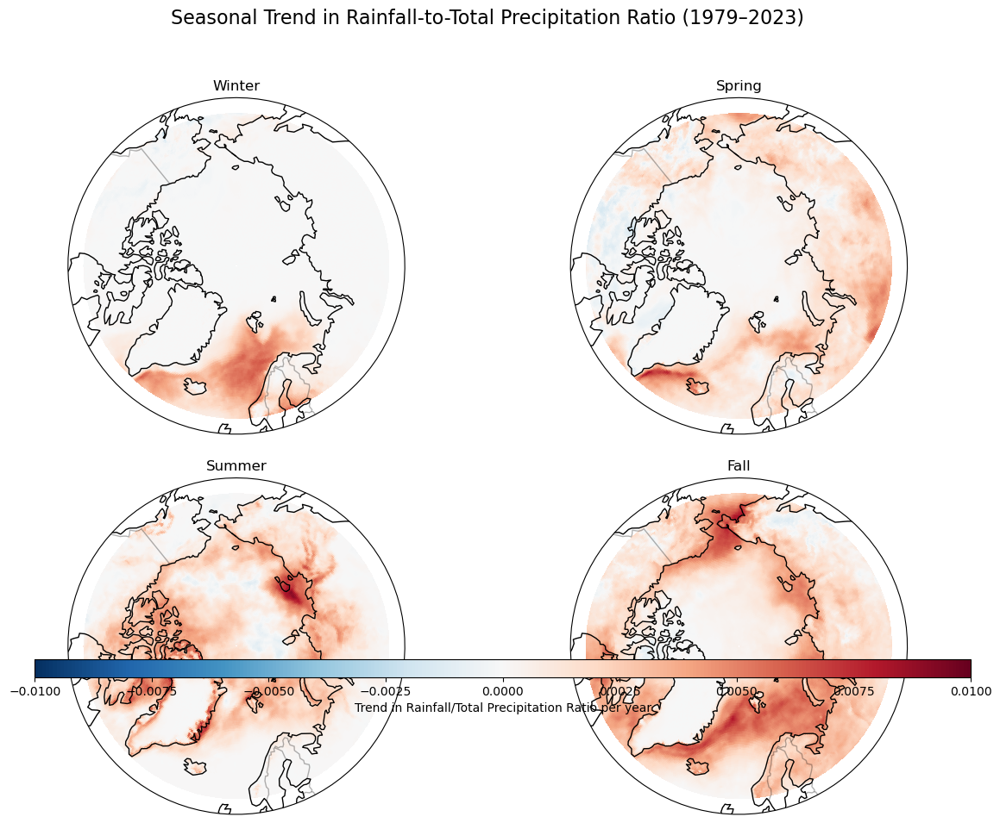

In [189]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath

# --- STEP 1: Create Rainfall Ratio ---
rain = (tp - sf).clip(min=0)  # Liquid precipitation
rain_ratio = rain / tp.where(tp != 0)  # Avoid division by zero

# --- STEP 2: Assign season and year labels ---
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

rain_ratio = rain_ratio.copy()  # Avoid modifying original
rain_ratio.coords['season'] = xr.apply_ufunc(np.vectorize(get_season), rain_ratio['date'].dt.month)
rain_ratio.coords['year'] = rain_ratio['date'].dt.year

# --- STEP 3: Define a trend function ---
def compute_trend(da):
    years = da['year']
    x = years - years.mean()
    slope = ((x * da).mean(dim='year')) / ((x**2).mean())
    return slope

# --- STEP 4: Compute trend for each season ---
trend_maps = {}
season_dict = {
    'Winter': [12, 1, 2],
    'Spring': [3, 4, 5],
    'Summer': [6, 7, 8],
    'Fall': [9, 10, 11]
}

for season, months in season_dict.items():
    season_data = rain_ratio.sel(date=rain_ratio['date'].dt.month.isin(months))
    seasonal_mean = season_data.groupby('date.year').mean(dim='date')
    seasonal_mean = seasonal_mean.rename({'year': 'year'})  # ensures coordinate name matches
    seasonal_mean.coords['year'] = seasonal_mean['year']  # required for trend function
    trend = compute_trend(seasonal_mean)
    trend_maps[season] = trend

# --- STEP 5: Plot seasonal trend maps ---
fig, axes = plt.subplots(2, 2, figsize=(14, 10), subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})
seasons = ['Winter', 'Spring', 'Summer', 'Fall']

for ax, season in zip(axes.flat, seasons):
    ax.set_title(season)
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linestyle='-', alpha=0.3)

    # Define a circular boundary for the polar plot
    theta = np.linspace(0, 2 * np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)

    trend = trend_maps[season]
    pcm = ax.pcolormesh(trend.longitude, trend.latitude, trend,
                        cmap='RdBu_r', vmin=-0.01, vmax=0.01,
                        transform=ccrs.PlateCarree())

# Add colorbar
cbar = fig.colorbar(pcm, ax=axes.ravel().tolist(), orientation='horizontal', pad=0.07, aspect=50)
cbar.set_label('Trend in Rainfall/Total Precipitation Ratio per year')

# Add overall title
fig.suptitle('Seasonal Trend in Rainfall-to-Total Precipitation Ratio (1979–2023)', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


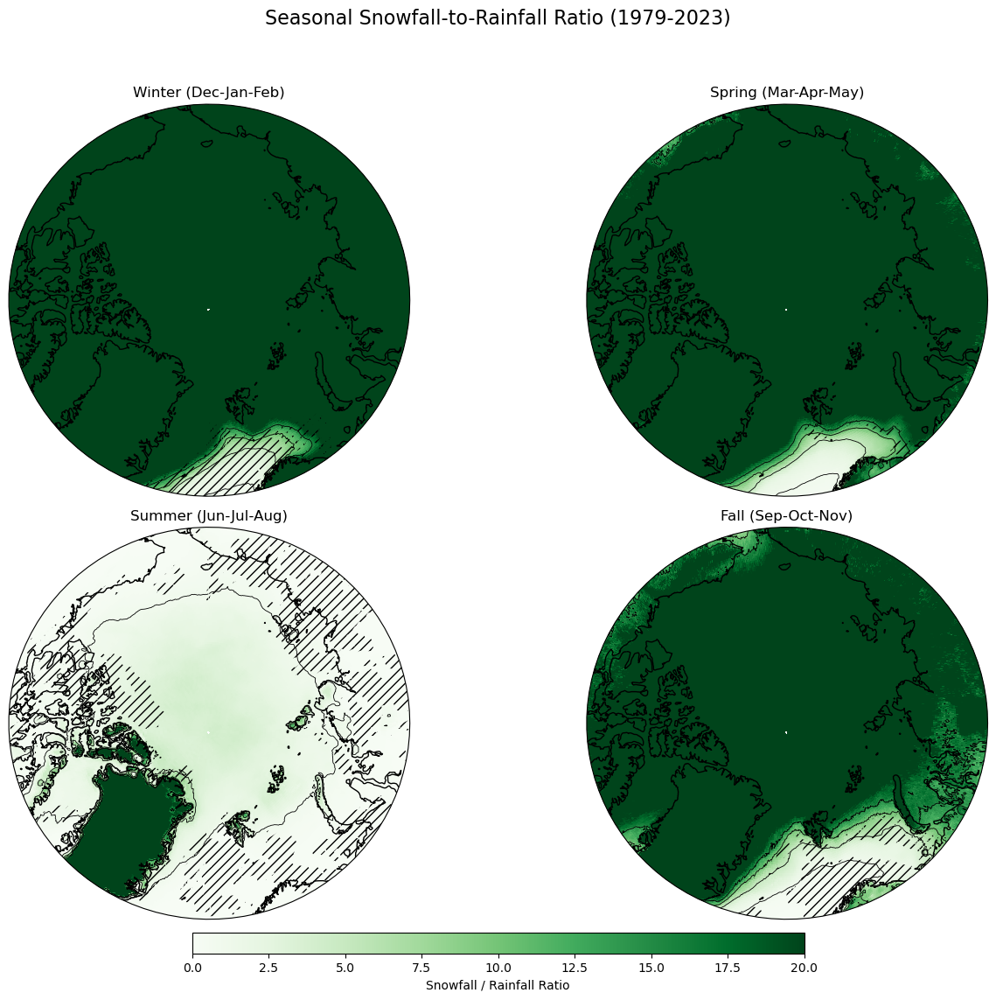

In [190]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
from scipy.stats import linregress

# --- Step 1: Compute Rainfall ---
rain = (tp - sf).clip(min=0)

# --- Step 2: Compute Snowfall-to-Rainfall Ratio ---
ratio = sf / rain.where(rain > 0)
ratio = ratio.clip(min=0, max=50)

# --- Step 3: Assign Seasonal Labels ---
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season), tp['date'].dt.month)
ratio.coords['season'] = season_labels

# --- Step 4: Compute Seasonal Climatology ---
seasonal_mean_ratio = ratio.groupby('season').mean(dim='date')

# --- Step 5: Compute Seasonal Trends and P-values ---
def compute_trend_and_pval(da):
    years = da['date'].dt.year
    x = years - years.mean()
    slopes = np.full((da.shape[1], da.shape[2]), np.nan)
    pvals = np.full((da.shape[1], da.shape[2]), np.nan)

    for i in range(da.shape[1]):
        for j in range(da.shape[2]):
            y = da[:, i, j]
            if np.any(~np.isnan(y)):
                res = linregress(x, y)
                slopes[i, j] = res.slope
                pvals[i, j] = res.pvalue
    return slopes, pvals

trend_list = []
pval_list = []
season_names = []

for season, da_season in ratio.groupby('season'):
    slope, pval = compute_trend_and_pval(da_season)
    da_slope = xr.DataArray(slope,
                            coords=[da_season.latitude, da_season.longitude],
                            dims=["latitude", "longitude"])
    da_pval = xr.DataArray(pval,
                           coords=[da_season.latitude, da_season.longitude],
                           dims=["latitude", "longitude"])
    trend_list.append(da_slope)
    pval_list.append(da_pval)
    season_names.append(season)

trend_data = xr.concat(trend_list, dim='season')
pval_data = xr.concat(pval_list, dim='season')
trend_data.coords['season'] = season_names
pval_data.coords['season'] = season_names

# --- Step 6: Plot Climatology with Contours & Significance Hatching ---
def plot_seasonal_ratio_climatology_with_significance(seasonal_mean_ratio, pval_data,
                                                      title="Seasonal Snowfall-to-Rainfall Ratio (1979-2023)",
                                                      cmap='Greens', vmin=0, vmax=20,
                                                      contour_levels=[1, 5, 10, 15],
                                                      significance_level=0.05):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    # Correct seasonal order and display names
    seasons = ['Winter (Dec-Jan-Feb)', 'Spring (Mar-Apr-May)',
               'Summer (Jun-Jul-Aug)', 'Fall (Sep-Oct-Nov)']
    season_short = ['Winter', 'Spring', 'Summer', 'Fall']

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = season_short[i]
        dat = seasonal_mean_ratio.sel(season=season)
        sig = pval_data.sel(season=season) < significance_level

        # Filled ratio field
        pcm = ax.pcolormesh(dat.longitude, dat.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        # Contour lines
        ax.contour(dat.longitude, dat.latitude, dat,
                   levels=contour_levels, colors='black', linewidths=0.6,
                   transform=ccrs.PlateCarree())

        # Significance hatching
        ax.contourf(sig.longitude, sig.latitude, sig,
                    levels=[0.5, 1], colors='none', hatches=['///'],
                    transform=ccrs.PlateCarree())

        ax.set_title(seasons[i], fontsize=12)

    # Colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Snowfall / Rainfall Ratio')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# --- Final Call ---
plot_seasonal_ratio_climatology_with_significance(seasonal_mean_ratio, pval_data)


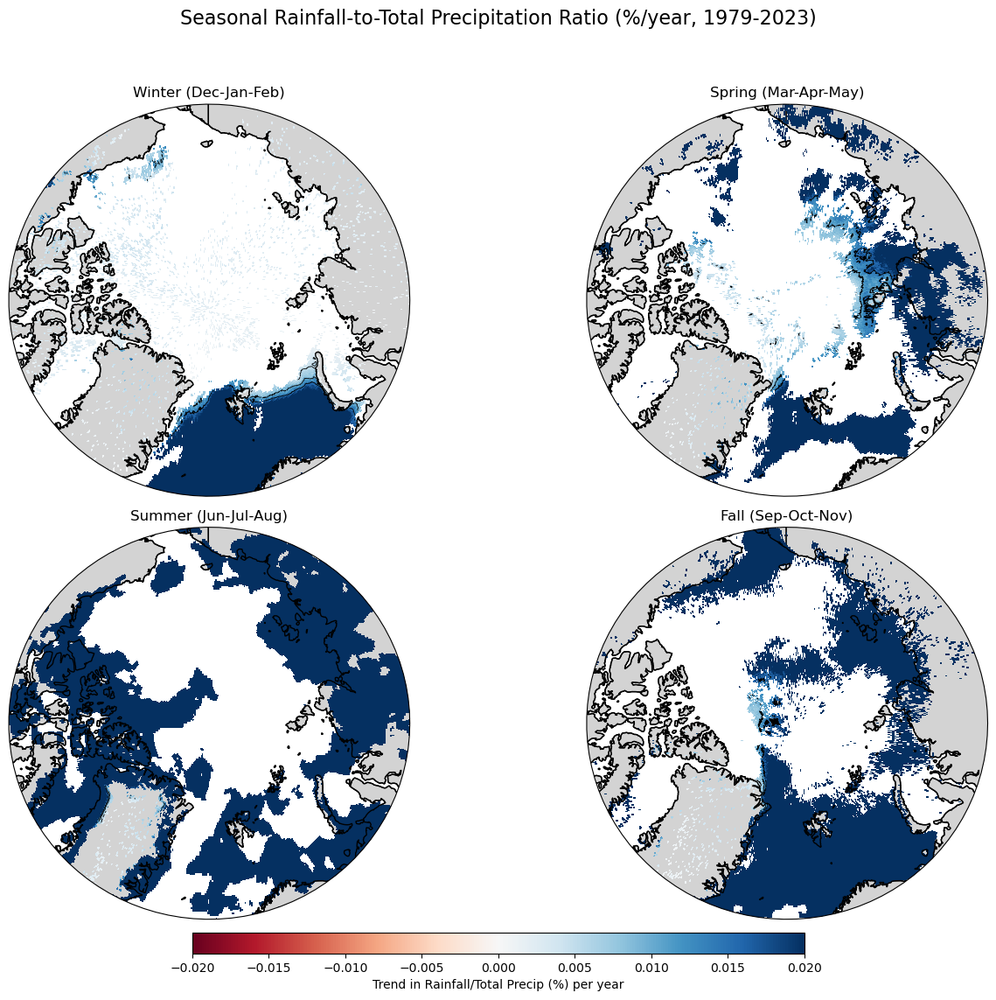

In [200]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
from scipy.stats import linregress

# --- Step 1: Compute Rainfall ---
rain = (tp - sf).clip(min=0)

# --- Step 2: Compute Snowfall-to-Rainfall Ratio ---
ratio = rain / tp.where(rain > 0)
ratio = ratio.clip(min=0, max=1)

# --- Step 3: Assign Seasonal Labels ---
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season), tp['date'].dt.month)
ratio.coords['season'] = season_labels

# --- Step 4: Compute Seasonal Climatology ---
seasonal_mean_ratio = ratio.groupby('season').mean(dim='date')

# --- Step 5: Compute Seasonal Trends and P-values ---
def compute_trend_and_pval(da):
    years = da['date'].dt.year
    x = years - years.mean()

    slopes = np.full((da.shape[1], da.shape[2]), np.nan)
    pvals = np.full((da.shape[1], da.shape[2]), np.nan)

    for i in range(da.shape[1]):
        for j in range(da.shape[2]):
            y = da[:, i, j].values
            valid_mask = ~np.isnan(y)

            if np.sum(valid_mask) >= 2:
                res = linregress(x[valid_mask], y[valid_mask])
                slopes[i, j] = res.slope * 100  # % per year
                pvals[i, j] = res.pvalue

    return slopes, pvals

trend_list = []
pval_list = []
season_names = []

for season, da_season in ratio.groupby('season'):
    slope, pval = compute_trend_and_pval(da_season)
    da_slope = xr.DataArray(slope,
                            coords=[da_season.latitude, da_season.longitude],
                            dims=["latitude", "longitude"])
    da_pval = xr.DataArray(pval,
                           coords=[da_season.latitude, da_season.longitude],
                           dims=["latitude", "longitude"])
    trend_list.append(da_slope)
    pval_list.append(da_pval)
    season_names.append(season)

trend_data = xr.concat(trend_list, dim='season')
pval_data = xr.concat(pval_list, dim='season')
trend_data.coords['season'] = season_names
pval_data.coords['season'] = season_names

# --- Step 6: Plot Climatology with Contours & Significance Hatching ---
def plot_seasonal_ratio_climatology_with_significance(seasonal_mean_ratio, pval_data,
                                                      title="Seasonal Rainfall-to-Total Precipitation Ratio (%/year, 1979-2023)",
                                                      cmap='RdBu', vmin=-0.020, vmax=0.020,
                                                      contour_levels=[-0.015, -0.010, -0.005, 0, 0.005, 0.010, 0.015],
                                                      significance_level=0.05):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    # Correct seasonal order and display names
    seasons = ['Winter (Dec-Jan-Feb)', 'Spring (Mar-Apr-May)',
               'Summer (Jun-Jul-Aug)', 'Fall (Sep-Oct-Nov)']
    season_short = ['Winter', 'Spring', 'Summer', 'Fall']

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = season_short[i]
        raw = seasonal_mean_ratio.sel(season=season)
        sig = pval_data.sel(season=season) < significance_level
        dat = raw.where(sig)  # only show significant trends       

        # Filled ratio field
        pcm = ax.pcolormesh(dat.longitude, dat.latitude, dat,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            vmin=vmin, vmax=vmax, shading='auto')

        # Contour lines
        ax.contour(dat.longitude, dat.latitude, dat,
                   levels=contour_levels, colors='black', linewidths=0.6,
                   transform=ccrs.PlateCarree())


        ax.set_title(seasons[i], fontsize=12)

    # Colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Trend in Rainfall/Total Precip (%) per year')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# --- Final Call ---
plot_seasonal_ratio_climatology_with_significance(seasonal_mean_ratio, pval_data)

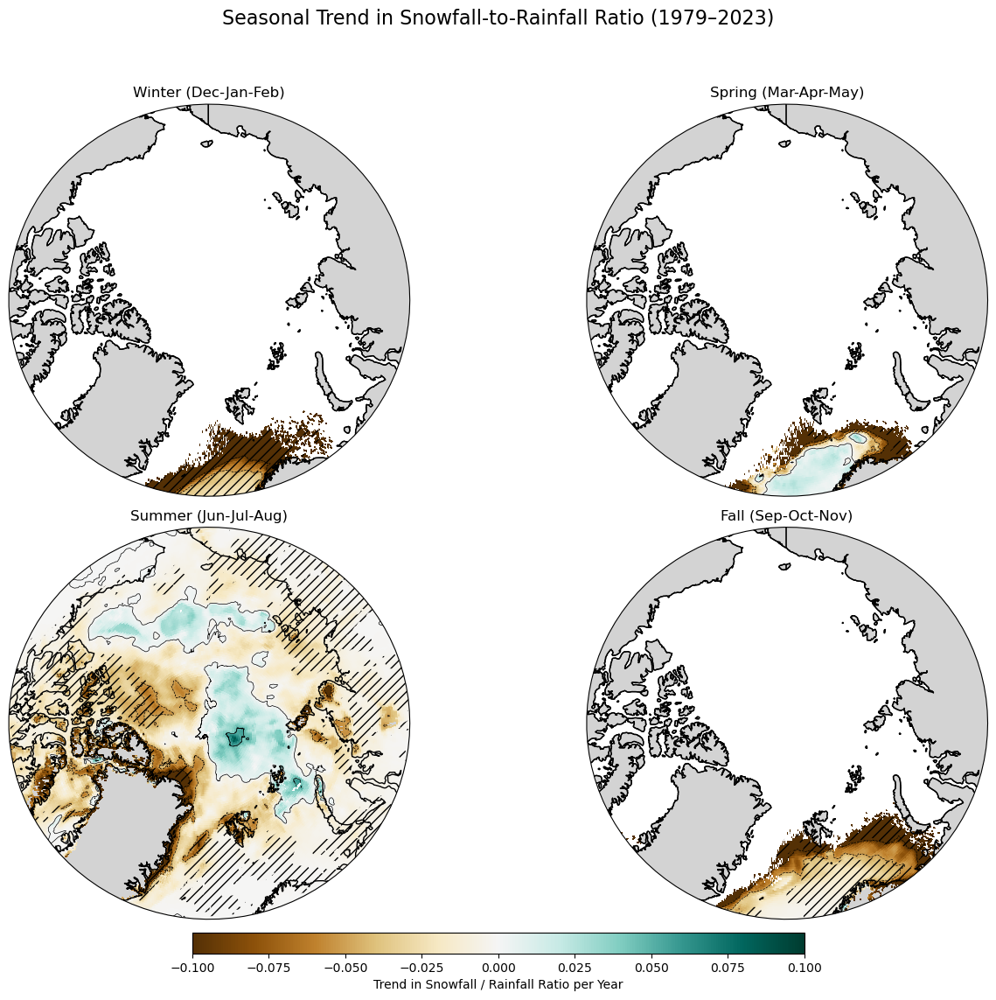

In [151]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
from scipy.stats import linregress

# --- Step 1: Compute Rainfall ---
rain = (tp - sf).clip(min=0)

# --- Step 2: Compute Snowfall-to-Rainfall Ratio ---
ratio = sf / rain.where(rain > 0)
ratio = ratio.clip(min=0, max=50)

# --- Step 3: Assign Seasonal Labels ---
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season), tp['date'].dt.month)
ratio.coords['season'] = season_labels

# --- Step 4: Compute Seasonal Climatology ---
seasonal_mean_ratio = ratio.groupby('season').mean(dim='date')

# --- Step 5: Compute Seasonal Trends and P-values ---
def compute_trend_and_pval(da):
    years = da['date'].dt.year
    x = years - years.mean()
    slopes = np.full((da.shape[1], da.shape[2]), np.nan)
    pvals = np.full((da.shape[1], da.shape[2]), np.nan)

    for i in range(da.shape[1]):
        for j in range(da.shape[2]):
            y = da[:, i, j]
            if np.any(~np.isnan(y)):
                res = linregress(x, y)
                slopes[i, j] = res.slope
                pvals[i, j] = res.pvalue
    return slopes, pvals

trend_list = []
pval_list = []
season_names = []

for season, da_season in ratio.groupby('season'):
    slope, pval = compute_trend_and_pval(da_season)
    da_slope = xr.DataArray(slope,
                            coords=[da_season.latitude, da_season.longitude],
                            dims=["latitude", "longitude"])
    da_pval = xr.DataArray(pval,
                           coords=[da_season.latitude, da_season.longitude],
                           dims=["latitude", "longitude"])
    trend_list.append(da_slope)
    pval_list.append(da_pval)
    season_names.append(season)

trend_data = xr.concat(trend_list, dim='season')
pval_data = xr.concat(pval_list, dim='season')
trend_data.coords['season'] = season_names
pval_data.coords['season'] = season_names

# --- Step 6: Plot Seasonal Trend with Significance Hatching ---
def plot_seasonal_trends_with_significance(trend_data, pval_data,
                                           title="Seasonal Trend in Snowfall-to-Rainfall Ratio (1979–2023)",
                                           cmap='BrBG', vmin=-0.1, vmax=0.1,
                                           contour_levels=[-0.1, -0.05, 0, 0.05, 0.1],
                                           significance_level=0.05):
    fig, axes = plt.subplots(2, 2, figsize=(14, 12),
                             subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    seasons = ['Winter (Dec-Jan-Feb)', 'Spring (Mar-Apr-May)',
               'Summer (Jun-Jul-Aug)', 'Fall (Sep-Oct-Nov)']
    season_short = ['Winter', 'Spring', 'Summer', 'Fall']

    for i, ax in enumerate(axes.flat):
        ax.set_global()
        ax.coastlines()
        ax.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black')
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle
        theta = np.linspace(0, 2 * np.pi, 100)
        circle = mpath.Path(np.vstack([np.cos(theta), np.sin(theta)]).T * 0.5 + 0.5)
        ax.set_boundary(circle, transform=ax.transAxes)

        season = season_short[i]
        trend = trend_data.sel(season=season)
        sig = pval_data.sel(season=season) < significance_level

        # Plot trend field
        pcm = ax.pcolormesh(trend.longitude, trend.latitude, trend,
                            cmap=cmap, shading='auto', vmin=vmin, vmax=vmax,
                            transform=ccrs.PlateCarree())

        # Add trend contours
        ax.contour(trend.longitude, trend.latitude, trend,
                   levels=contour_levels, colors='black', linewidths=0.5,
                   transform=ccrs.PlateCarree())

        # Add hatching for significant areas
        ax.contourf(sig.longitude, sig.latitude, sig,
                    levels=[0.5, 1], colors='none', hatches=['///'],
                    transform=ccrs.PlateCarree())

        ax.set_title(seasons[i], fontsize=12)

    # Add colorbar
    cbar_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Trend in Snowfall / Rainfall Ratio per Year')

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0.1, 1, 0.95])
    plt.show()

# --- Final Call ---
plot_seasonal_trends_with_significance(trend_data, pval_data)


In [155]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.path as mpath
from scipy.stats import linregress

# --- STEP 1: Compute Snowfall Ratio ---
# Assumes you have 'tp', 'sf', and 'date' from your xarray dataset `ds`
rain = (tp - sf).clip(min=0)
snowfall_ratio = (sf / tp).where(tp > 0)  # Avoid division by zero

# --- STEP 2: Add Seasonal Labels ---
def get_season(month):
    if month in [12, 1, 2]: return 'Winter'
    elif month in [3, 4, 5]: return 'Spring'
    elif month in [6, 7, 8]: return 'Summer'
    else: return 'Fall'

season_labels = xr.apply_ufunc(np.vectorize(get_season), snowfall_ratio['date'].dt.month)
snowfall_ratio.coords['season'] = ('date', season_labels)

# --- STEP 3: Compute Seasonal Trends and Significance ---
def compute_trend_pval_seasonal(da_seasonal):
    seasons = ['Winter', 'Spring', 'Summer', 'Fall']
    slopes = []
    pvals = []

    years = da_seasonal['date'].dt.year
    t = (years - years[0]).values

    for season in seasons:
        seasonal_data = da_seasonal.where(da_seasonal['season'] == season, drop=True)
        grouped = seasonal_data.groupby('date').mean(dim='date')
        y = grouped.values

        slope = np.full(y.shape[1:], np.nan)
        pval = np.full(y.shape[1:], np.nan)

        for i in range(y.shape[1]):
            for j in range(y.shape[2]):
                y_ij = y[:, i, j]
                if np.all(np.isnan(y_ij)):
                    continue
                res = linregress(t[~np.isnan(y_ij)], y_ij[~np.isnan(y_ij)])
                slope[i, j] = res.slope * 100  # ratio change per year → percent/year
                pval[i, j] = res.pvalue

        slope_da = xr.DataArray(slope, dims=("latitude", "longitude"),
                                coords={"latitude": da_seasonal.latitude.data, "longitude": da_seasonal.longitude.data})
        pval_da = xr.DataArray(pval, dims=("latitude", "longitude"),
                               coords={"latitude": da_seasonal.latitude.data, "longitude": da_seasonal.longitude.data})

        slopes.append(slope_da)
        pvals.append(pval_da)

    return slopes, pvals, seasons

# Run trend + p-value analysis
slopes, pvals, season_names = compute_trend_pval_seasonal(snowfall_ratio)

# --- STEP 4: Plot with Significance Hatching ---
def plot_seasonal_trends_with_hatching(slopes, pvals, season_names,
                                        title='Seasonal Trend in Snowfall/Total Precip (%) (1979–2023)',
                                        vmin=-1, vmax=1, cmap='BrBG'):
    fig, axes = plt.subplots(2, 2, figsize=(12, 10), subplot_kw={'projection': ccrs.Orthographic(central_latitude=90)})

    for ax, slope, pval, season in zip(axes.flat, slopes, pvals, season_names):
        ax.set_title(season, fontsize=10)
        ax.coastlines()
        ax.set_extent([-180, 180, 66.5, 90], crs=ccrs.PlateCarree())

        # Arctic circle mask
        theta = np.linspace(0, 2 * np.pi, 100)
        center, radius = [0.5, 0.5], 0.5
        verts = np.vstack([np.sin(theta), np.cos(theta)]).T
        circle = mpath.Path(verts * radius + center)
        ax.set_boundary(circle, transform=ax.transAxes)

        # Plot trend values
        pcm = ax.pcolormesh(slope.longitude, slope.latitude, slope,
                            transform=ccrs.PlateCarree(), cmap=cmap,
                            shading='auto', vmin=vmin, vmax=vmax)

        # Hatching for p < 0.05
        sig = pval < 0.05
        ax.contourf(slope.longitude, slope.latitude, sig,
                    levels=[0.5, 1], colors='none', hatches=['////'],
                    transform=ccrs.PlateCarree())

    # Shared colorbar
    cbar_ax = fig.add_axes([0.25, 0.1, 0.5, 0.03])
    cbar = fig.colorbar(pcm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Trend in Snowfall / Total Precipitation Ratio (% per year)')

    plt.suptitle(title, fontsize=13, y=0.97)
    plt.tight_layout(rect=[0, 0.12, 1, 0.94])
    plt.show()

# --- STEP 5: Run the Plot ---
plot_seasonal_trends_with_hatching(slopes, pvals, season_names)


TypeError: Using a DataArray object to construct a variable is ambiguous, please extract the data using the .data property.